In [2]:
import warnings
import statistics
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import skfuzzy as fuzz

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.io import arff
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_mutual_info_score,
    fowlkes_mallows_score,
    adjusted_rand_score,
)
from sklearn.feature_selection import mutual_info_classif, SelectKBest, VarianceThreshold
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.model_selection import GridSearchCV

warnings.filterwarnings("ignore")

In [1]:
pip install -U scikit-fuzzy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 994.0/994.0 kB 11.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.4.2-py3-none-any.whl size=894077 sha256=8c90ab869cf52949599db949594ca138eb4f9c8638a75948ac35e7b937a6987b
  Stored in directory: /root/.cache/pip/wheels/4f/86/1b/dfd97134a2c8313e519bcebd95d3fedc7be7944db022094bc8
Successfully built scikit-fuzzy


In [3]:
def clean_data(dframe, is_labeled=True):
    """
    Cleans the DataFrame by handling missing values, dropping columns with constant values,
    and label encoding categorical columns.

    Parameters:
    - dframe: Original DataFrame
    - is_labeled: Boolean indicating whether the DataFrame is labeled or unlabeled

    Returns:
    - Cleaned DataFrame
    """
    df = dframe.copy()

    # Fill missing values with mean for numeric columns
    for column in df.columns:
        if df[column].dtype != object:
            df[column] = df[column].fillna(df[column].mean())

    # Drop columns with constant values
    columns_to_drop = [col for col in df.columns if len(df[col].unique()) == 1]
    df.drop(columns=columns_to_drop, inplace=True)

    # Label encode text label columns
    for column_name in df.columns:
        if df[column_name].dtype == object:
            df[column_name] = LabelEncoder().fit_transform(df[column_name])

    # Check if the last column is label encoded or not
    if is_labeled and (df.iloc[:, -1].dtype == object or df.iloc[:, -1].dtype == bool):
        print("Last column is not label encoded. Label encoding it now...")
        df.iloc[:, -1] = LabelEncoder().fit_transform(df.iloc[:, -1])

    return df

def normalize_columns(df, list_of_columns, is_labeled=True):
    """
    Normalizes specified columns using StandardScaler.

    Parameters:
    - df: Original DataFrame
    - list_of_columns: List of columns to normalize

    Returns:
    - DataFrame with normalized columns
    """
    dframe = df.copy()
    if len(list_of_columns) > 0:
        # If the dataset is labeled and the last column is not to be normalized
        if is_labeled:
            last_column = dframe.columns[-1]
            list_of_columns = [col for col in list_of_columns if col != last_column]

            # Normalize the specified columns
        for column_name in list_of_columns:
            dframe[column_name] = StandardScaler().fit_transform(dframe[column_name].values.reshape(-1, 1))

    return dframe

def feature_selection_variance_threshold(df, t_value, is_labeled=True):
    """
    Perform feature selection using VarianceThreshold.

    Parameters:
    - df: Original DataFrame
    - t_value: Threshold value for variance

    Returns:
    - DataFrame with selected features
    """
    dframe = df.copy()
    selector = VarianceThreshold(threshold=t_value)
    # Separate the target variable (last column)
    if is_labeled:
        target_column = df.columns[-1]
        X = df.drop(columns=[target_column])
        y = df[target_column]
        # Create a VarianceThreshold selector
        # Fit the selector to the features
        X_selected = selector.fit_transform(X)
        # Get the indices of the selected features
        features_to_keep = selector.get_support(indices=True)
        # Select the features using the indices
        selected_features = X.iloc[:, features_to_keep]
        # Concatenate the selected features with the target column
        result_df = pd.concat([selected_features, y], axis=1)
        return result_df
    else:
        selector.fit(dframe)
        features_to_keep = selector.get_support(indices=True)
        return dframe.iloc[:,features_to_keep]

def feature_selection_k_best(df, k_value, is_labeled=True):
    """
    Perform feature selection using SelectKBest with mutual_info_classif.

    Parameters:
    - df: Original DataFrame
    - k_value: Number of top features to select

    Returns:
    - DataFrame with selected features
    """
    if is_labeled:
    # Separate the target variable (last column)
        target_column = df.columns[-1]
        X = df.drop(columns=[target_column])
        y = df[target_column]
    else:
        X = df.copy()
        y = np.zeros(df.shape[0])

    # Create a SelectKBest selector
    selector = SelectKBest(score_func=mutual_info_classif, k=k_value)

    # Fit the selector to the features
    X_selected = selector.fit_transform(X, y)

    # Get the indices of the selected features
    features_to_keep = selector.get_support(indices=True)

    # Select the features using the indices
    selected_features = X.iloc[:, features_to_keep]

    if is_labeled:
        # Concatenate the selected features with the target column
        result_df = pd.concat([selected_features, y], axis=1)
        return result_df
    else:
        selected_feature_names = X.columns[features_to_keep]
    return X[selected_feature_names]



In [5]:
labeled_datasets, unlabeled_datasets, cleaned_labeled_datasets, cleaned_unlabeled_datasets = [], [], [], []

# labeled Datasets
rice = arff.loadarff("datasets/D1-RiceCammeoOsmancik.arff")
rice_dataset = pd.DataFrame(rice[0])
labeled_datasets.append(("Rice Dataset", rice_dataset))

electrical_grid_large = pd.read_csv('datasets/D2-ElectricGrid.csv')
labeled_datasets.append(("Electrical Grid Large Dataset", electrical_grid_large))

online_shoppers_intention = pd.read_csv('datasets/D3-OnlineShoppersIntention.csv')
labeled_datasets.append(("Online Shoppers Intention", online_shoppers_intention))

# unlabeled Datasets
file_names = ['gt_2011.csv', 'gt_2012.csv', 'gt_2013.csv', 'gt_2014.csv', 'gt_2015.csv']
combined_df = pd.DataFrame()
for file_name in file_names:
    temp_df = pd.read_csv('datasets/Gas turbine/' + file_name)
    gas_turbine = pd.concat([combined_df, temp_df], ignore_index=True)
unlabeled_datasets.append(("Gas Turbine Dataset", gas_turbine))

seoul_bike = pd.read_csv("datasets/D2-SeoulBikeData.csv", encoding='unicode_escape')
columns_to_drop=['Date']
seoul_bike = seoul_bike.drop(columns=columns_to_drop)
unlabeled_datasets.append(("Seoul Bike Dataset", seoul_bike))

facebook = pd.read_csv('datasets/D3-Facebook.csv')
unlabeled_datasets.append(("Facebook Dataset", facebook))

print("Labeled Datasets")

for dataset_name, dataset in labeled_datasets:
    print("\n\n=======================================")
    print(f"Dataset: {dataset_name}")
    print("=======================================\n\n")
    print(dataset)

    cleaned_data = clean_data(dataset, is_labeled=True)
    normalized_data = normalize_columns(cleaned_data, cleaned_data.columns[:-1].tolist(), is_labeled=True)
    var_selected_data = feature_selection_variance_threshold(normalized_data, 0.2, is_labeled=True)
    k_best_selected_data = feature_selection_k_best(var_selected_data, var_selected_data.shape[1] - 1, is_labeled=True)
    cleaned_labeled_datasets.append((dataset_name, k_best_selected_data))

    unique_labels = k_best_selected_data.iloc[:, -1].unique()
    print("Unique Labels:", unique_labels)

print("Unlabeled Datasets")

for dataset_name, dataset in unlabeled_datasets:
    print("\n\n=======================================")
    print(f"Dataset: {dataset_name}")
    print("=======================================\n\n")
    print(dataset)

    cleaned_data = clean_data(dataset, is_labeled=False)
    normalized_data = normalize_columns(cleaned_data, cleaned_data.columns.tolist(), is_labeled=False)
    var_selected_data = feature_selection_variance_threshold(normalized_data, 0.2, is_labeled=False)
    k_best_selected_data = feature_selection_k_best(var_selected_data, var_selected_data.shape[1] - 1, is_labeled=False)
    cleaned_unlabeled_datasets.append((dataset_name, k_best_selected_data))

Labeled Datasets


Dataset: Rice Dataset


         Area   Perimeter  Major_Axis_Length  Minor_Axis_Length  Eccentricity  \
0     15231.0  525.578979         229.749878          85.093788      0.928882   
1     14656.0  494.311005         206.020065          91.730972      0.895405   
2     14634.0  501.122009         214.106781          87.768288      0.912118   
3     13176.0  458.342987         193.337387          87.448395      0.891861   
4     14688.0  507.166992         211.743378          89.312454      0.906691   
...       ...         ...                ...                ...           ...   
3805  11441.0  415.858002         170.486771          85.756592      0.864280   
3806  11625.0  421.390015         167.714798          89.462570      0.845850   
3807  12437.0  442.498993         183.572922          86.801979      0.881144   
3808   9882.0  392.296997         161.193985          78.210480      0.874406   
3809  11434.0  404.709991         161.079269          90.868195   

Dataset: Rice Dataset

Best K-Means Hyperparameters: {'init': 'random', 'max_iter': 100, 'n_clusters': 2, 'random_state': 0}


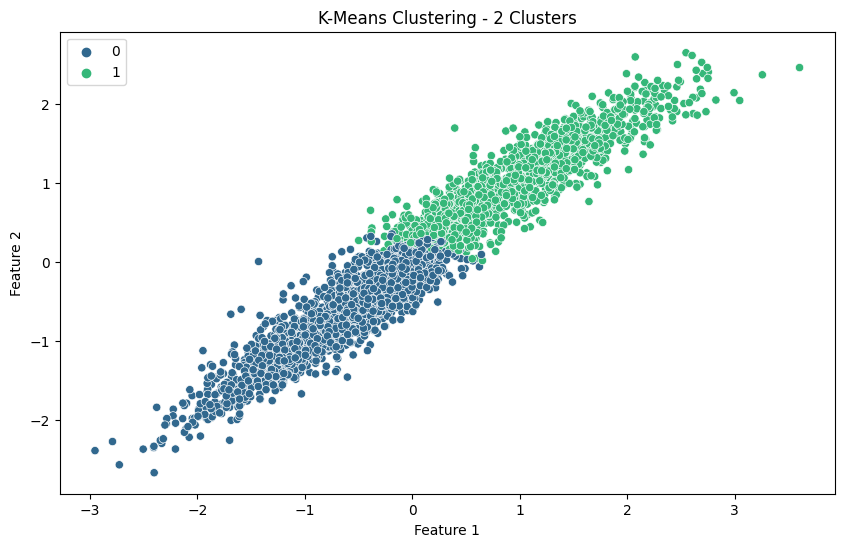

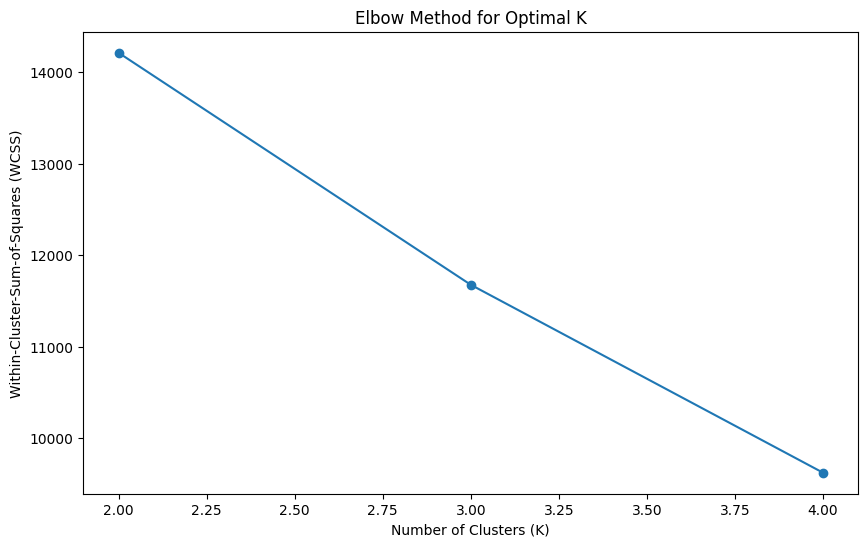



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.41746915142372887
Optimal Value of k from Davies Bouldin Index: 2 with score: 0.9383742861528225
Optimal Value of k from Calinski Harabasz Index: 2 with score: 3587.413913999138
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.6036496110940845
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.8609840249190356
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.7149124831971515
Dunn Index values for different K values: [0.0066148005, 0.0064940406, 0.0066117835]
Optimal K based on Dunn Index: 2



Dataset: Electrical Grid Large Dataset

Best K-Means Hyperparameters: {'init': 'k-means++', 'max_iter': 100, 'n_clusters': 2, 'random_state': 0}


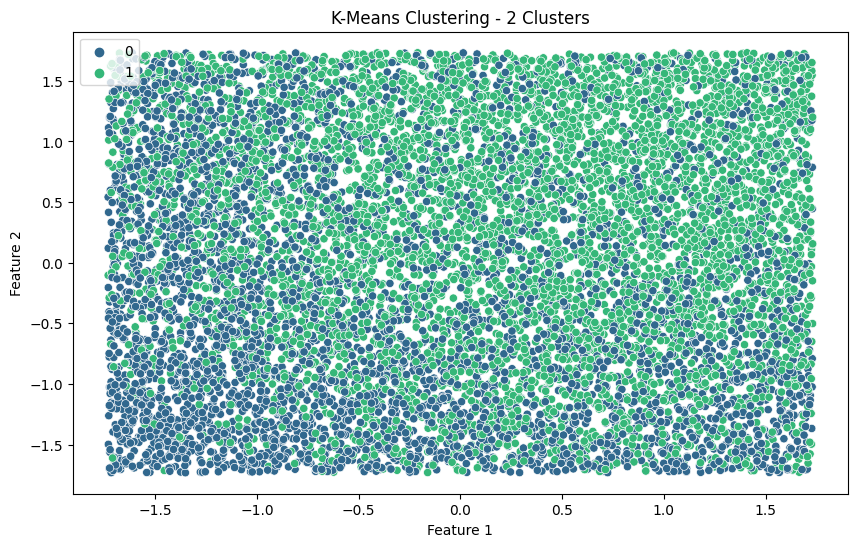

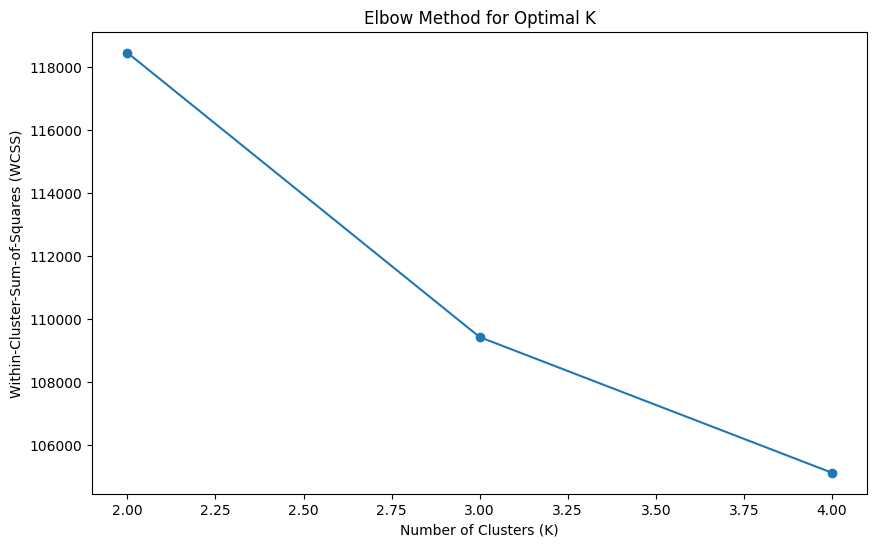



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.10341011472412094
Optimal Value of k from Davies Bouldin Index: 3 with score: 2.542448269137735
Optimal Value of k from Calinski Harabasz Index: 2 with score: 1170.6106513535583
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.6249260554841038
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.8504472996517836
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.6861947692227016
Dunn Index values for different K values: [0.084174916, 0.0905376, 0.084174916]
Optimal K based on Dunn Index: 3



Dataset: Online Shoppers Intention

Best K-Means Hyperparameters: {'init': 'random', 'max_iter': 100, 'n_clusters': 2, 'random_state': 50}


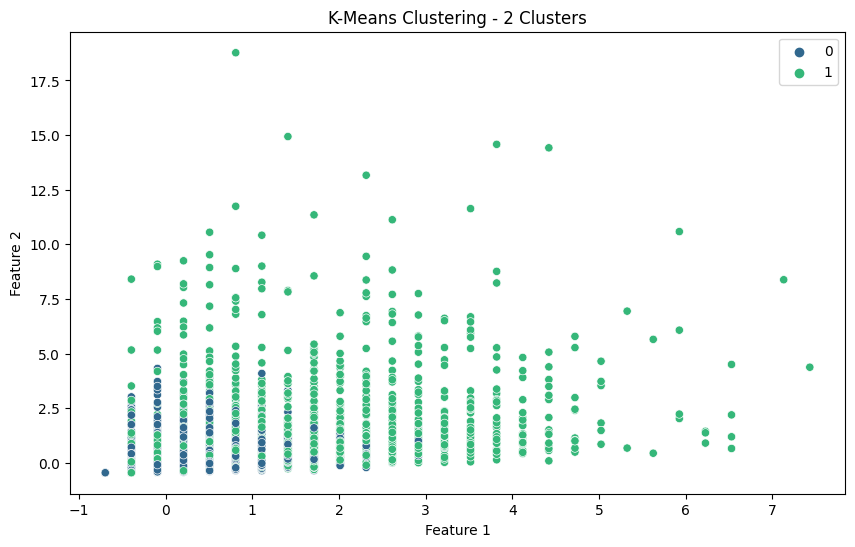

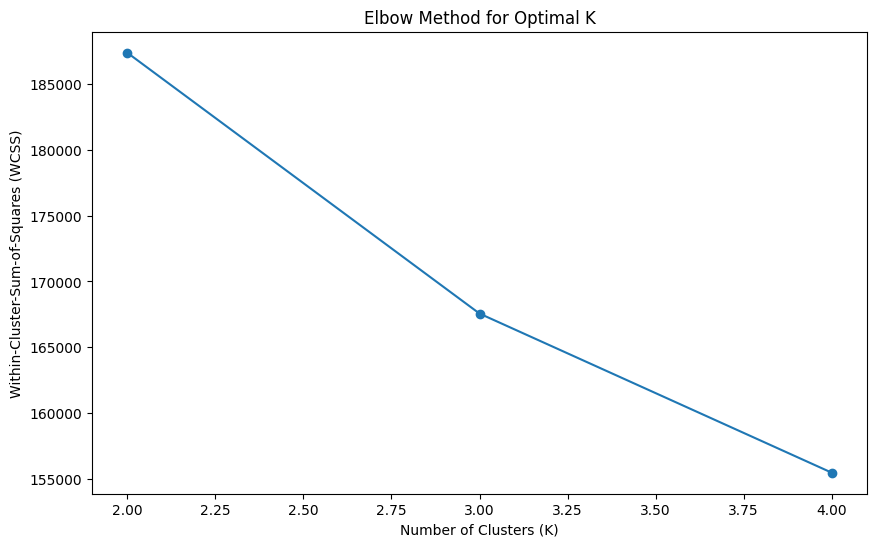



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.25859880695199056
Optimal Value of k from Davies Bouldin Index: 3 with score: 1.7796653566655776
Optimal Value of k from Calinski Harabasz Index: 3 with score: 1606.0093487707343
Optimal Value of k from Adjusted Mutual Info: 3 with score: 0.0356285472021527
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.7628555940533649
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.10216492371617192
Dunn Index values for different K values: [0.013150433, 0.0074030324, 0.0049766405]
Optimal K based on Dunn Index: 2



Dataset: Gas Turbine Dataset

Best K-Means Hyperparameters: {'init': 'k-means++', 'max_iter': 100, 'n_clusters': 2, 'random_state': 50}


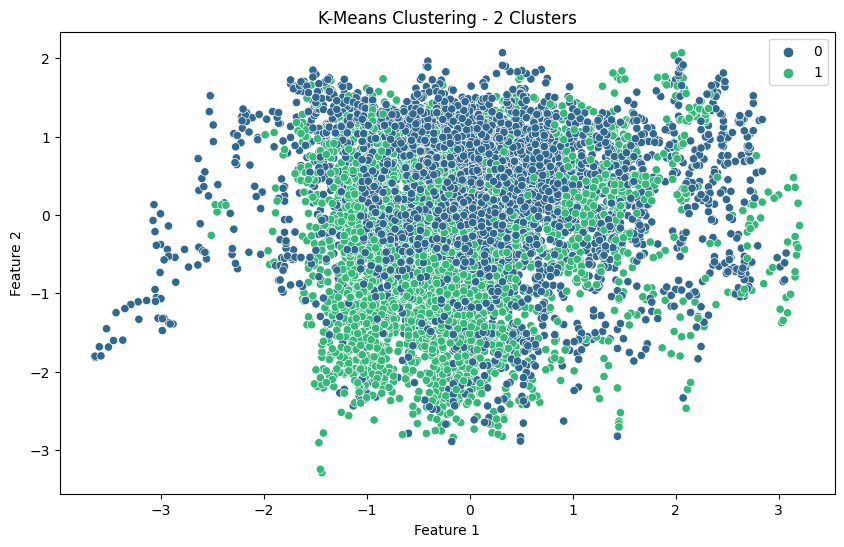

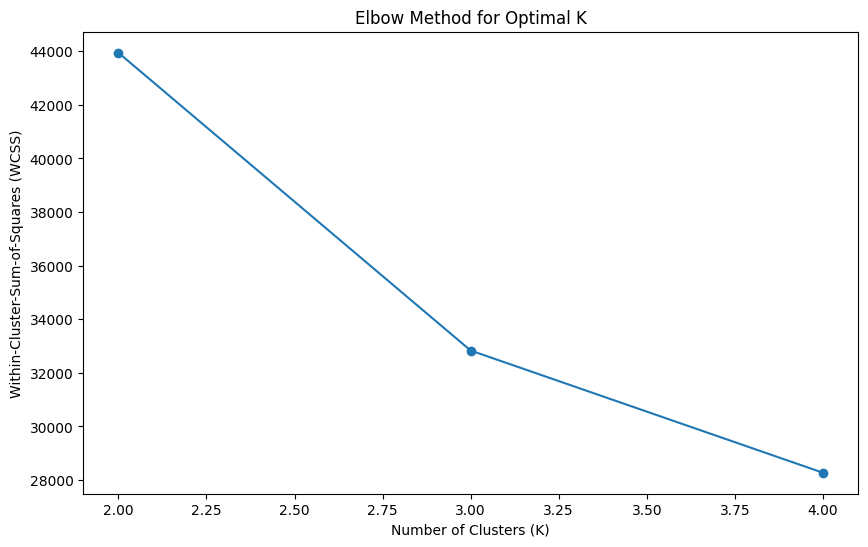



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.35465528802127555
Optimal Value of k from Davies Bouldin Index: 2 with score: 1.072330849254841
Optimal Value of k from Calinski Harabasz Index: 2 with score: 5021.434951165285
Optimal Value of k from Adjusted Mutual Info: 3 with score: 0.0036497085851716978
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.004423194717369763
Optimal Value of k from Adjusted Rand Score: 3 with score: 1.5985266956611866e-05
Dunn Index values for different K values: [0.0054789465, 0.004678732, 0.0066315155]
Optimal K based on Dunn Index: 4



Dataset: Seoul Bike Dataset

Best K-Means Hyperparameters: {'init': 'random', 'max_iter': 100, 'n_clusters': 2, 'random_state': 0}


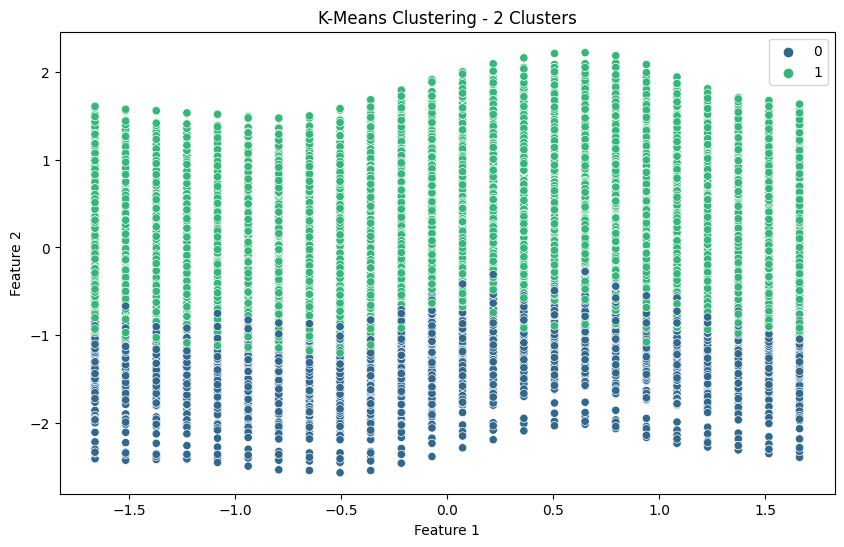

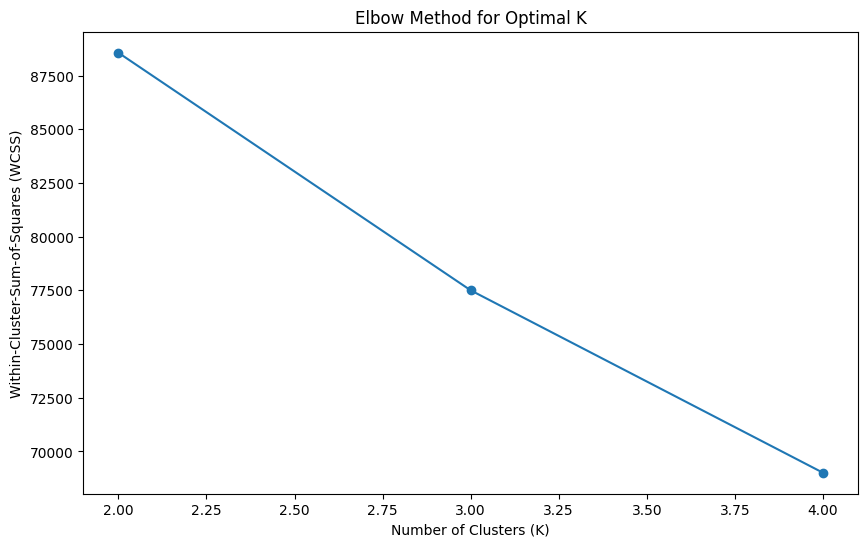



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.21562833624854183
Optimal Value of k from Davies Bouldin Index: 4 with score: 1.4949051471367645
Optimal Value of k from Calinski Harabasz Index: 2 with score: 1637.5411680822137
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.21984096935229713
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.7375927188939768
Optimal Value of k from Adjusted Rand Score: 4 with score: 0.06434814489161084
Dunn Index values for different K values: [0.0036998123, 0.0035476815, 0.0035476815]
Optimal K based on Dunn Index: 2



Dataset: Facebook Dataset

Best K-Means Hyperparameters: {'init': 'k-means++', 'max_iter': 100, 'n_clusters': 2, 'random_state': 50}


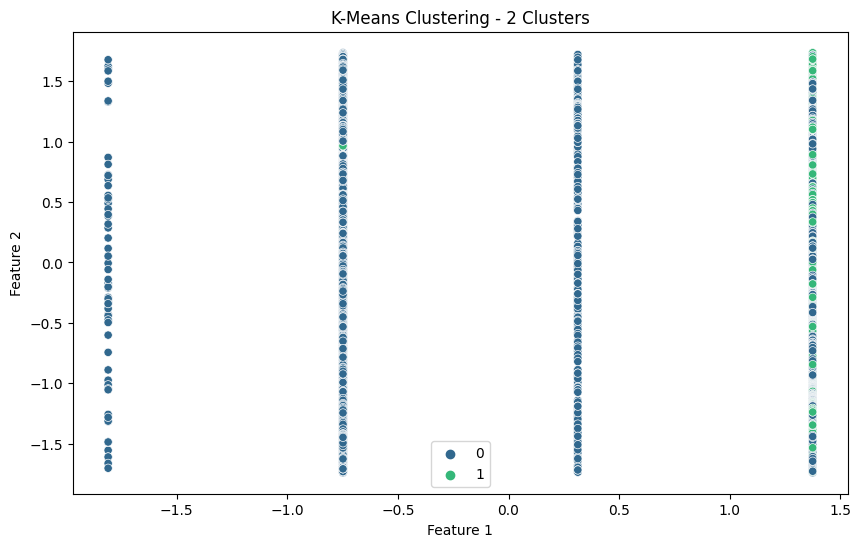

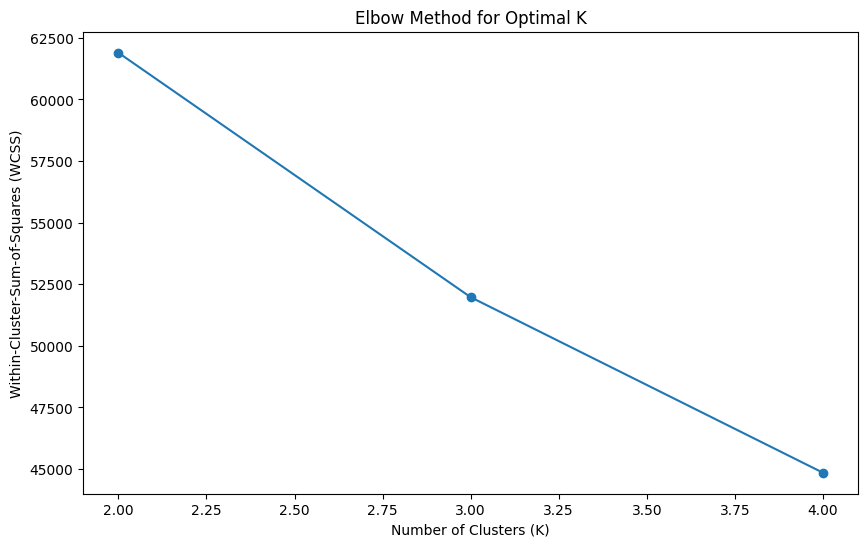



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.7032287265723169
Optimal Value of k from Davies Bouldin Index: 3 with score: 1.1801129265176928
Optimal Value of k from Calinski Harabasz Index: 2 with score: 1782.352151105358
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.25230629321625847
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.9485423190345046
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.4823911062026457
Dunn Index values for different K values: [0.009865099, 0.0012780124, 0.0012780124]
Optimal K based on Dunn Index: 2





In [6]:
def cluster_kmeans(df, k_values=2):
    """
    Perform K-Means clustering on the given DataFrame for a range of K values.
    Output optimal K values based on various metrics.

    Parameters:
    - df: DataFrame for clustering
    - k_values: Maximum number of clusters to consider

    Output:
    - Print optimal K values and metrics
    - Write results to files
    """
    dframe = df.copy()
    k_values = range(2, k_values)

    # Hyperparameter tuning using GridSearchCV
    kmeans = KMeans()
    param_grid = {
        'n_clusters': [2, 3, 4, 5],
        'init': ['k-means++', 'random'],
        'max_iter': [100, 300, 500],
        'random_state': [0, 50]
    }
    grid_search = GridSearchCV(estimator=kmeans, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
    grid_search.fit(X=dframe.iloc[:, :-1], y=dframe.iloc[:, -1])
    best_params = grid_search.best_params_
    print("\nBest K-Means Hyperparameters:", best_params)

    silhouette_scores, dbi_scores, ch_indices, ami_scores, fm_scores, ar_scores, wcss, dunn_indices = [], [], [], [], [], [], [], []

    for k in k_values:
        # Fit K-Means clustering with the current K value
        kmeans = KMeans(n_clusters=k, init=best_params['init'], max_iter=best_params['max_iter'], random_state=best_params['random_state'])
        kmeans.fit(dframe)
        wcss.append(kmeans.inertia_)

        # Evaluate clustering metrics
        silhouette_scores.append(silhouette_score(dframe, kmeans.labels_))
        dbi_scores.append(davies_bouldin_score(dframe, kmeans.labels_))
        ch_indices.append(calinski_harabasz_score(dframe, kmeans.labels_))
        ami_scores.append(adjusted_mutual_info_score(dframe.iloc[:, -1], kmeans.labels_))
        fm_scores.append(fowlkes_mallows_score(dframe.iloc[:, -1], kmeans.labels_))
        ar_scores.append(adjusted_rand_score(dframe.iloc[:, -1], kmeans.labels_))

        # Visualize cluster assignments for optimal K
        if k == best_params['n_clusters']:
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=dframe.iloc[:, 0], y=dframe.iloc[:, 1], hue=kmeans.labels_, palette='viridis')
            plt.title(f'K-Means Clustering - {k} Clusters')
            plt.show()
            print("\n\n")

    # Visualize the Elbow Method
    plt.figure(figsize=(10, 6))
    plt.plot(k_values, wcss, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Within-Cluster-Sum-of-Squares (WCSS)')
    plt.show()
    print("\n")

    # Find the K with the highest Dunn Index
    for k in k_values:
        kmeans = KMeans(n_clusters=k, init=best_params['init'], max_iter=best_params['max_iter'], random_state=best_params['random_state'])
        kmeans.fit(dframe.astype(np.float32))

        # Calculate the pairwise distances between data points
        distances = pairwise_distances(dframe.astype(np.float32))

        # Calculate the minimum inter-cluster distance
        min_inter_cluster_distance = np.inf
        for i in range(k):
            for j in range(i + 1, k):
                inter_cluster_distance = np.min(distances[np.where(kmeans.labels_ == i)][:, np.where(kmeans.labels_ == j)])
                min_inter_cluster_distance = min(min_inter_cluster_distance, inter_cluster_distance)

        # Calculate the maximum intra-cluster diameter
        max_intra_cluster_diameter = max([np.max(distances[np.where(kmeans.labels_ == i)]) for i in range(k)])

        # Calculate the Dunn Index
        dunn_index = min_inter_cluster_distance / max_intra_cluster_diameter
        dunn_indices.append(dunn_index)

    # Optimal K based on the Dunn Index
    optimal_k = k_values[np.argmax(dunn_indices)]

    optimal_k_silhouette = k_values[np.argmax(silhouette_scores)]
    optimal_k_dbi = k_values[np.argmin(dbi_scores)]
    optimal_k_ch = k_values[np.argmax(ch_indices)]
    slopes = [wcss[i] - wcss[i - 1] for i in range(1, len(wcss))]
    best_k = slopes.index(max(slopes)) + 1
    optimal_ami = k_values[np.argmax(ami_scores)]
    optimal_fm = k_values[np.argmax(fm_scores)]
    optimal_ar = k_values[np.argmax(ar_scores)]

    print("Best K value from Elbow Method:", best_k)
    print('Optimal Value of k from Silhouette Score:', optimal_k_silhouette, 'with score:', max(silhouette_scores))
    print('Optimal Value of k from Davies Bouldin Index:', optimal_k_dbi, 'with score:', min(dbi_scores))
    print('Optimal Value of k from Calinski Harabasz Index:', optimal_k_ch, 'with score:', max(ch_indices))
    print('Optimal Value of k from Adjusted Mutual Info:', optimal_ami, 'with score:', max(ami_scores))
    print('Optimal Value of k from Fowlkes Mallows Score:', optimal_fm, 'with score:', max(fm_scores))
    print('Optimal Value of k from Adjusted Rand Score:', optimal_ar, 'with score:', max(ar_scores))
    print("Dunn Index values for different K values:", dunn_indices)
    print("Optimal K based on Dunn Index:", optimal_k)
    print("\n\n")

    # with open('C:\\Users\\Dell\\Desktop\\Clustering_Template\\labeled\\kmeans.txt', 'a') as file:
    #     file.write(f'{max(silhouette_scores)},{min(dbi_scores)},{max(dunn_indices)},{max(ch_indices)},{max(ami_scores)},{max(fm_scores)},{max(ar_scores)},{statistics.mode([optimal_k_silhouette, optimal_k_dbi, optimal_k_ch, optimal_ami, optimal_fm, optimal_ar, best_k, optimal_k])}\n')

    # with open('C:\\Users\\Dell\\Desktop\\Clustering_Template\\labeled\\kmeans_results.txt', 'a') as file1:
    #     file1.write("Best K value from Elbow Method: {}\n".format(best_k))
    #     file1.write('Optimal Value of k from Silhouette Score: {} with score: {}\n'.format(optimal_k_silhouette, max(silhouette_scores)))
    #     file1.write('Optimal Value of k from Davies Bouldin Index: {} with score: {}\n'.format(optimal_k_dbi, min(dbi_scores)))
    #     file1.write('Optimal Value of k from Calinski Harabasz Index: {} with score: {}\n'.format(optimal_k_ch, max(ch_indices)))
    #     file1.write('Optimal Value of k from Adjusted Mutual Info: {} with score: {}\n'.format(optimal_ami, max(ami_scores)))
    #     file1.write('Optimal Value of k from Fowlkes Mallows Score: {} with score: {}\n'.format(optimal_fm, max(fm_scores)))
    #     file1.write('Optimal Value of k from Adjusted Rand Score: {} with score: {}\n'.format(optimal_ar, max(ar_scores)))
    #     file1.write("Dunn Index values for different K values: {}\n".format(dunn_indices))
    #     file1.write("Optimal K based on Dunn Index: {}\n".format(optimal_k))

for dataset_name, dataset in cleaned_labeled_datasets:
    print("==================================================")
    print("Dataset:", dataset_name)
    print("==================================================")
    cluster_kmeans(dataset, 5)

for dataset_name, dataset in cleaned_unlabeled_datasets:
    print("==================================================")
    print("Dataset:", dataset_name)
    print("==================================================")
    cluster_kmeans(dataset, 5)

Dataset: Rice Dataset


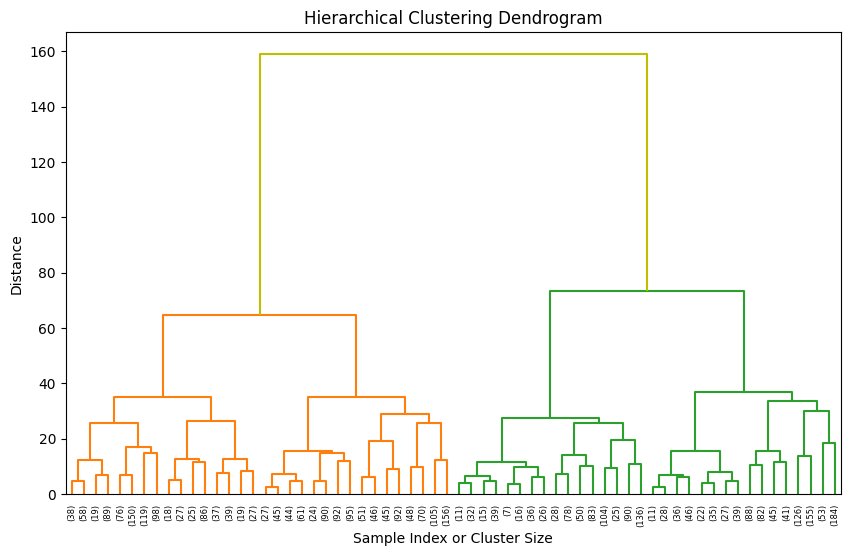


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


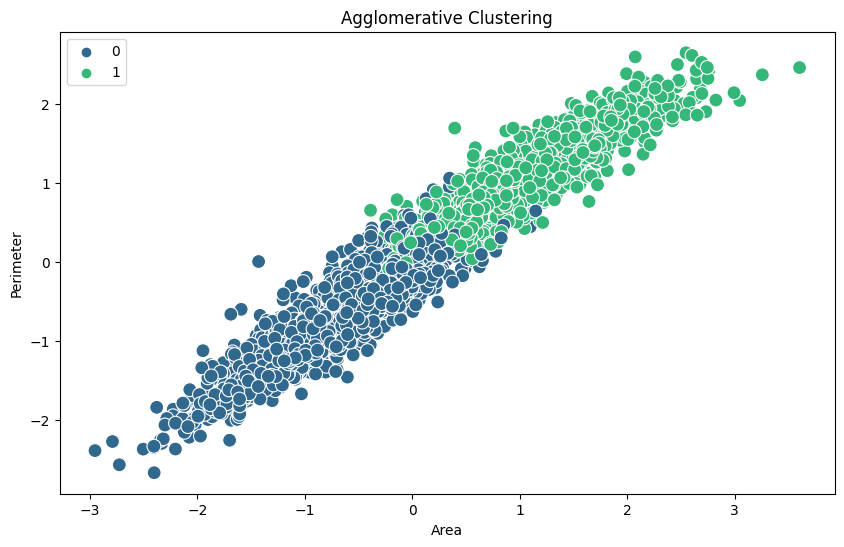

Optimal Value of k from Silhouette Score: 2 with score: 0.39546058085688846
Optimal Value of k from Davies Bouldin Index: 2 with score: 0.9655797474697546
Optimal Value of k from Calinski Harabasz Index: 2 with score: 3264.7538484841057
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.5143881240751659
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.8180012815728576
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.6228344303285032
Dunn Index values for different K values: [0.0116122095, 0.0096307285, 0.0096307285]
Optimal K based on Dunn Index: 2



Dataset: Electrical Grid Large Dataset


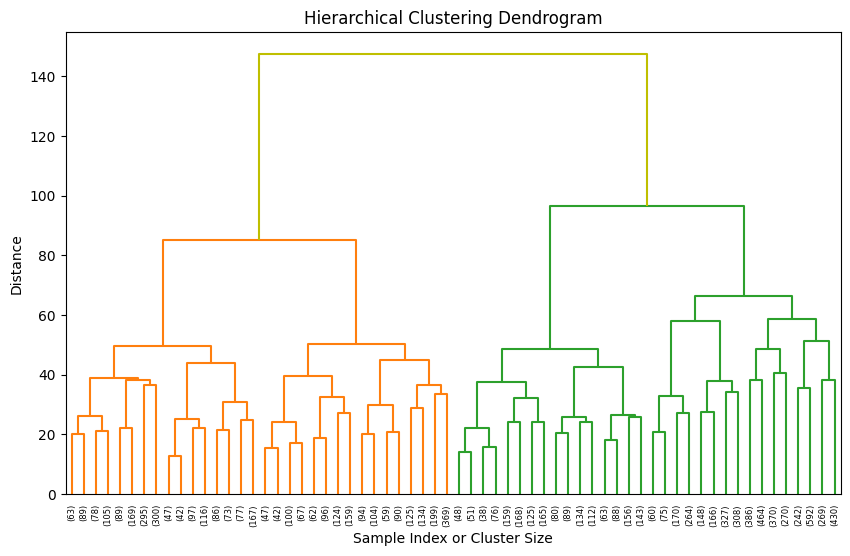


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


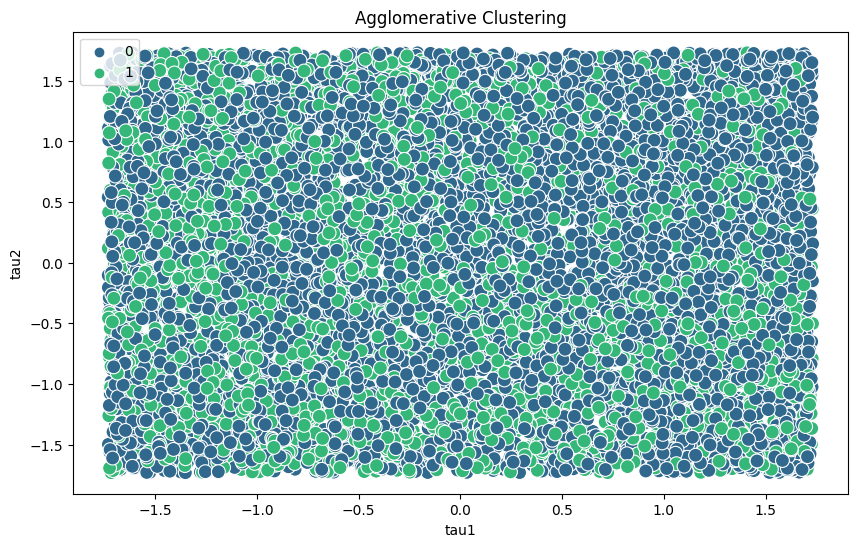

Optimal Value of k from Silhouette Score: 2 with score: 0.05715212891151482
Optimal Value of k from Davies Bouldin Index: 3 with score: 3.5674097862370897
Optimal Value of k from Calinski Harabasz Index: 2 with score: 619.9560108480737
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.12875572109685454
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.5670366252099378
Optimal Value of k from Adjusted Rand Score: 4 with score: 0.11338652941126098
Dunn Index values for different K values: [0.12762631, 0.12551756, 0.12551756]
Optimal K based on Dunn Index: 2



Dataset: Online Shoppers Intention


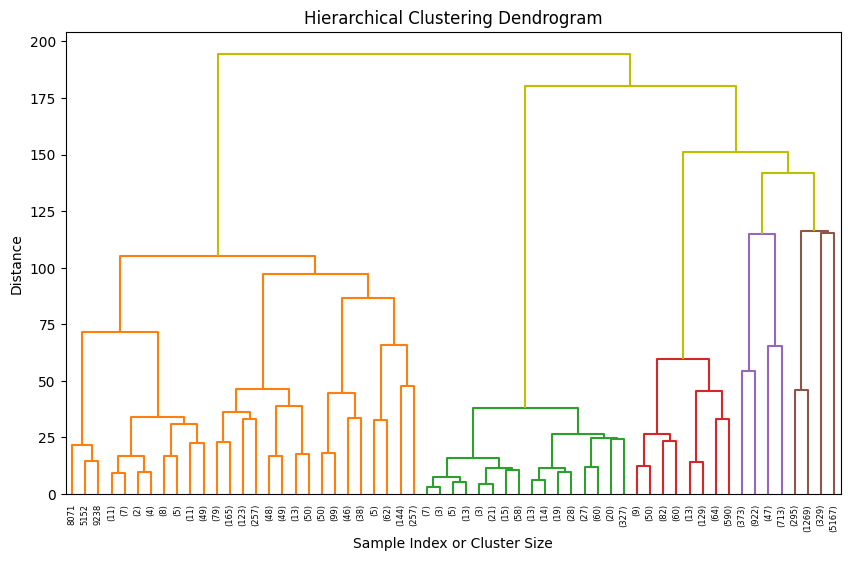


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


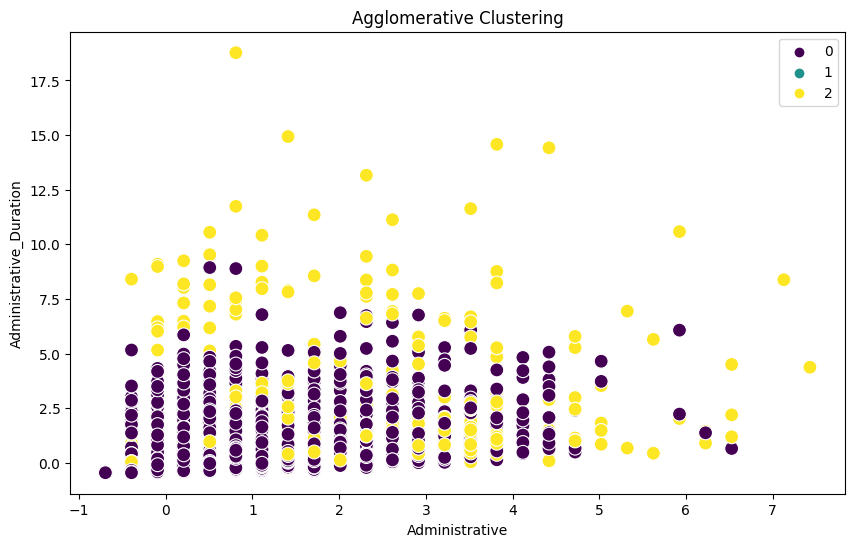

Optimal Value of k from Silhouette Score: 3 with score: 0.27550770241495776
Optimal Value of k from Davies Bouldin Index: 2 with score: 1.2146693773012944
Optimal Value of k from Calinski Harabasz Index: 3 with score: 1292.045533628886
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.052156134276967685
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.7926928824235927
Optimal Value of k from Adjusted Rand Score: 4 with score: 0.10437814975639881
Dunn Index values for different K values: [0.011154718, 0.011154718, 0.011154718]
Optimal K based on Dunn Index: 2



Dataset: Gas Turbine Dataset


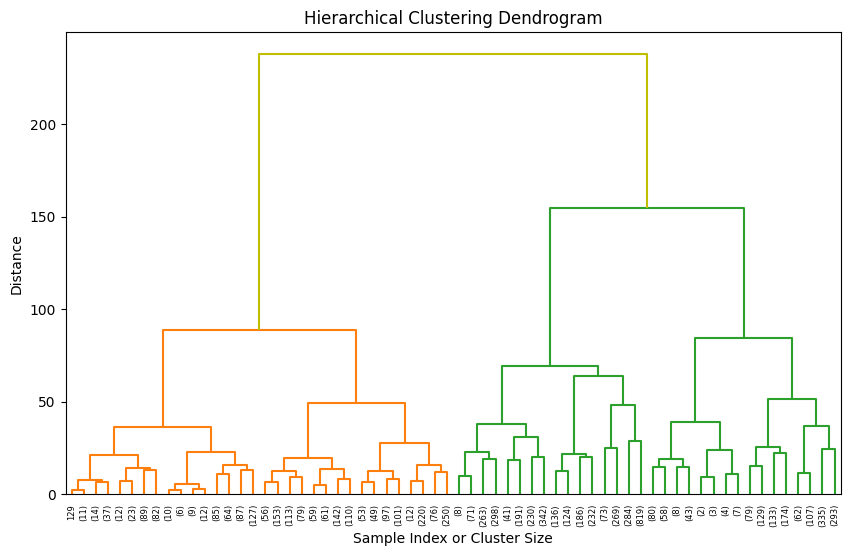


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


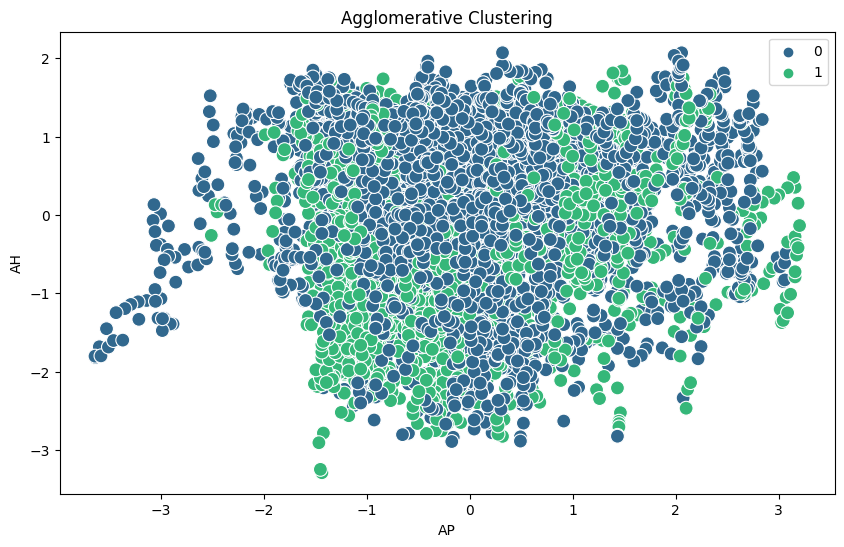

Optimal Value of k from Silhouette Score: 2 with score: 0.3839830815611031
Optimal Value of k from Davies Bouldin Index: 2 with score: 0.9674135924297255
Optimal Value of k from Calinski Harabasz Index: 3 with score: 5132.309474821385
Optimal Value of k from Adjusted Mutual Info: 3 with score: 0.0032452810914358086
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.0044834478568620394
Optimal Value of k from Adjusted Rand Score: 3 with score: 1.3713044521502728e-05
Dunn Index values for different K values: [0.016165936, 0.013998115, 0.013998115]
Optimal K based on Dunn Index: 2



Dataset: Seoul Bike Dataset


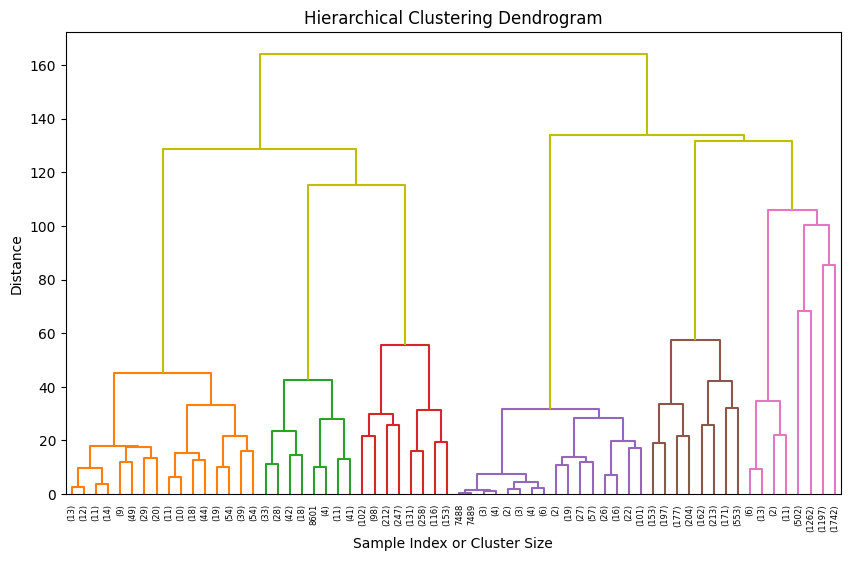


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


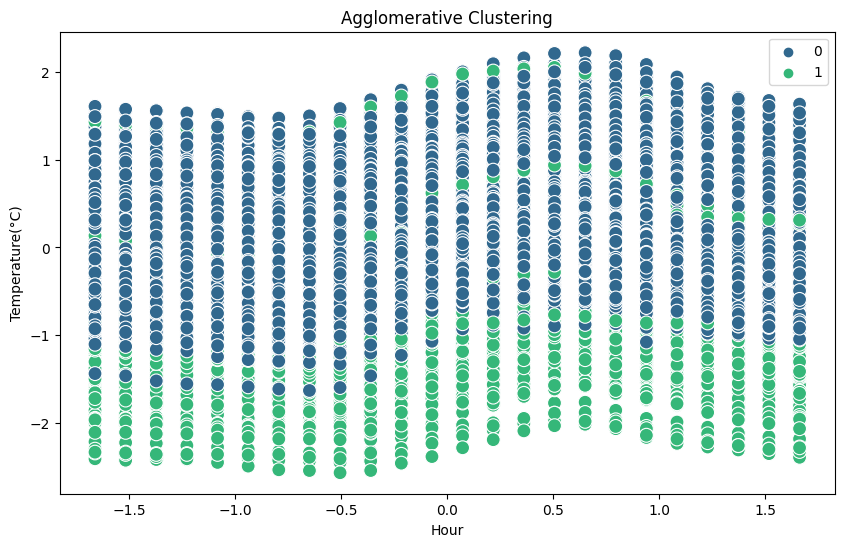

Optimal Value of k from Silhouette Score: 2 with score: 0.2442646848774406
Optimal Value of k from Davies Bouldin Index: 4 with score: 1.5788263329131165
Optimal Value of k from Calinski Harabasz Index: 2 with score: 1600.9143804055248
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.013000272203657879
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.7414703978411087
Optimal Value of k from Adjusted Rand Score: 3 with score: -0.003418363360617344
Dunn Index values for different K values: [0.030606527, 0.0100208735, 0.0100208735]
Optimal K based on Dunn Index: 2



Dataset: Facebook Dataset


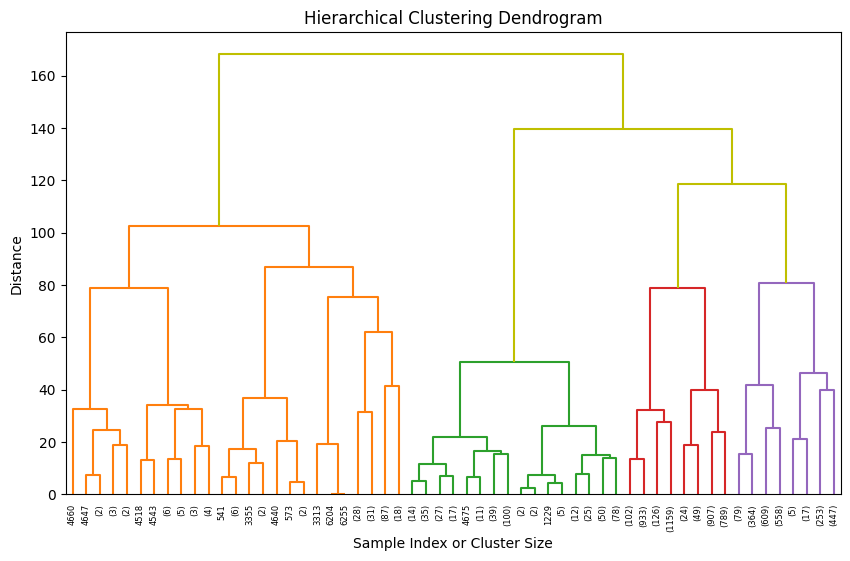


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


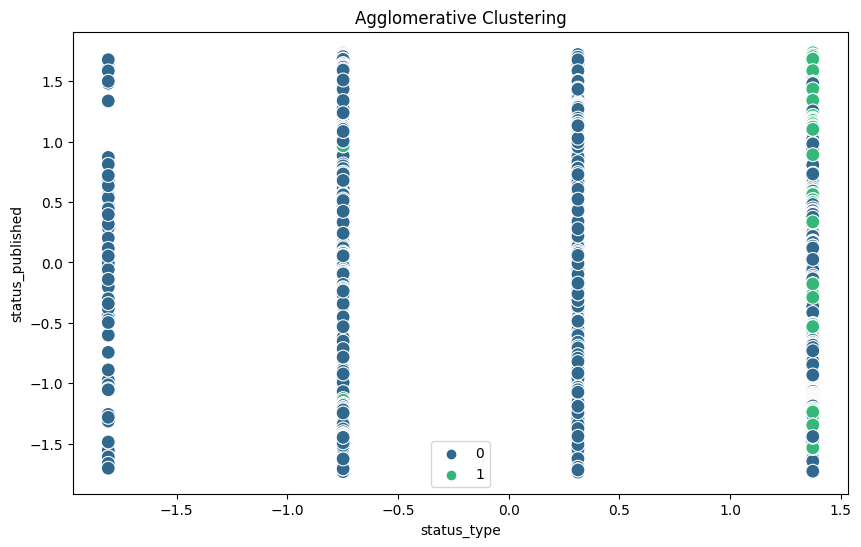

Optimal Value of k from Silhouette Score: 2 with score: 0.7217841700446479
Optimal Value of k from Davies Bouldin Index: 3 with score: 1.2634669669548362
Optimal Value of k from Calinski Harabasz Index: 4 with score: 1744.3894173970998
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.17497303573486017
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.9419786951046674
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.36809422768868055
Dunn Index values for different K values: [0.014998226, 0.0028460913, 0.0028460913]
Optimal K based on Dunn Index: 2





In [8]:
def visualize_dendrogram(df):
    """
    Visualize dendrogram for hierarchical clustering.
    """
    linkage_matrix = linkage(df, method='ward', metric='euclidean')

    plt.figure(figsize=(10, 6))
    dendrogram(linkage_matrix, p=5, truncate_mode='level', orientation='top', show_leaf_counts=True, above_threshold_color='y')
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample Index or Cluster Size')
    plt.ylabel('Distance')
    plt.show()

def visualize_clusters(df, labels):
    """
    Visualize scatter plot for cluster.
    """
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df.iloc[:, 0], y=df.iloc[:, 1], hue=labels, palette='viridis', s=100)
    plt.title('Agglomerative Clustering')
    plt.show()

def cluster_agglomerative(df, k_values=2):
    """
    Perform Agglomerative clustering on the given DataFrame for a range of K values.
    Output optimal K values based on various metrics.

    Parameters:
    - df: DataFrame for clustering
    - k_values: Maximum number of clusters to consider

    Output:
    - Print optimal K values and metrics
    - Write results to files
    """
    dframe = df.copy()
    k_values = range(2, k_values)

    visualize_dendrogram(dframe)

    # Hyperparameter tuning using GridSearchCV
    agg_clustering = AgglomerativeClustering()
    param_grid = {
        'n_clusters': k_values,
        'linkage': ['ward', 'complete', 'average'],
    }
    grid_search = GridSearchCV(estimator=agg_clustering, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
    grid_search.fit(dframe)

    best_params = grid_search.best_params_
    print("\nBest Agglomerative Clustering Hyperparameters:", best_params)

    silhouette_scores, dbi_scores, ch_indices, ami_scores, fm_scores, ar_scores, dunn_indices = [], [], [], [], [], [], []

    true_labels = dframe.pop(dframe.columns[-1])

    for k in k_values:
        agg = AgglomerativeClustering(n_clusters=k, linkage=best_params['linkage'])
        agg.fit(dframe)
        silhouette_scores.append(silhouette_score(dframe, agg.labels_))
        dbi_scores.append(davies_bouldin_score(dframe, agg.labels_))
        ch_indices.append(calinski_harabasz_score(dframe, agg.labels_))
        predicted_labels = agg.labels_
        ami_scores.append(adjusted_mutual_info_score(true_labels, predicted_labels))
        fm_scores.append(fowlkes_mallows_score(true_labels, predicted_labels))
        ar_scores.append(adjusted_rand_score(true_labels, predicted_labels))

    optimal_k_silhouette = k_values[np.argmax(silhouette_scores)]
    optimal_k_dbi = k_values[np.argmin(dbi_scores)]
    optimal_k_ch = k_values[np.argmax(ch_indices)]
    optimal_ami = k_values[np.argmax(ami_scores)]
    optimal_fm = k_values[np.argmax(fm_scores)]
    optimal_ar = k_values[np.argmax(ar_scores)]

    agg_optimal = AgglomerativeClustering(n_clusters=optimal_k_silhouette, linkage=best_params['linkage'])
    optimal_labels = agg_optimal.fit_predict(dframe)
    visualize_clusters(dframe, optimal_labels)

    print('Optimal Value of k from Silhouette Score:', optimal_k_silhouette, 'with score:', max(silhouette_scores))
    print('Optimal Value of k from Davies Bouldin Index:', optimal_k_dbi, 'with score:', min(dbi_scores))
    print('Optimal Value of k from Calinski Harabasz Index:', optimal_k_ch, 'with score:', max(ch_indices))
    print('Optimal Value of k from Adjusted Mutual Info:', optimal_ami, 'with score:', max(ami_scores))
    print('Optimal Value of k from Fowlkes Mallows Score:', optimal_fm, 'with score:', max(fm_scores))
    print('Optimal Value of k from Adjusted Rand Score:', optimal_ar, 'with score:', max(ar_scores))

    dunn_indices = []
    df2 = dframe.astype(np.float32)

    for k in k_values:
        agg = AgglomerativeClustering(n_clusters=k, linkage='ward')
        agg.fit(dframe)

        distances = pairwise_distances(df2)
        min_inter_cluster_distance = np.inf
        for i in range(k):
            for j in range(i + 1, k):
                inter_cluster_distance = np.min(distances[np.where(agg.labels_ == i)][:, np.where(agg.labels_ == j)])
                min_inter_cluster_distance = min(min_inter_cluster_distance, inter_cluster_distance)

        max_intra_cluster_diameter = max([np.max(distances[np.where(agg.labels_ == i)]) for i in range(k)])
        dunn_index = min_inter_cluster_distance / max_intra_cluster_diameter
        dunn_indices.append(dunn_index)

    optimal_k = k_values[np.argmax(dunn_indices)]
    optimal_k_list = [optimal_k_silhouette, optimal_k_dbi, optimal_k_ch, optimal_ami, optimal_fm, optimal_ar, optimal_k]

    print("Dunn Index values for different K values:", dunn_indices)
    print("Optimal K based on Dunn Index:", optimal_k)
    print("\n\n")

    # with open('C:\\Users\\Dell\\Desktop\\Clustering_Template\\labeled\\agglomerative.txt', 'a') as file:
    #     file.write(f'{max(silhouette_scores)},{min(dbi_scores)},{max(dunn_indices)},{max(ch_indices)},{max(ami_scores)},{max(fm_scores)},{max(ar_scores)},{statistics.mode(optimal_k_list)}\n')

    # with open('C:\\Users\\Dell\\Desktop\\Clustering_Template\\labeled\\agglomerative_results.txt', 'a') as file1:
    #     file1.write('Optimal Value of k from Silhouette Score: {} with score: {}\n'.format(optimal_k_silhouette, max(silhouette_scores)))
    #     file1.write('Optimal Value of k from Davies Bouldin Index: {} with score: {}\n'.format(optimal_k_dbi, min(dbi_scores)))
    #     file1.write('Optimal Value of k from Calinski Harabasz Index: {} with score: {}\n'.format(optimal_k_ch, max(ch_indices)))
    #     file1.write('Optimal Value of k from Adjusted Mutual Info: {} with score: {}\n'.format(optimal_ami, max(ami_scores)))
    #     file1.write('Optimal Value of k from Fowlkes Mallows Score: {} with score: {}\n'.format(optimal_fm, max(fm_scores)))
    #     file1.write('Optimal Value of k from Adjusted Rand Score: {} with score: {}\n'.format(optimal_ar, max(ar_scores)))
    #     file1.write("Dunn Index values for different K values: {}\n".format(dunn_indices))
    #     file1.write("Optimal K based on Dunn Index: {}\n".format(optimal_k))

for dataset_name, dataset in cleaned_labeled_datasets:
    print("==================================================")
    print("Dataset:", dataset_name)
    print("==================================================")
    cluster_agglomerative(dataset, 5)

for dataset_name, dataset in cleaned_unlabeled_datasets:
    print("==================================================")
    print("Dataset:", dataset_name)
    print("==================================================")
    cluster_agglomerative(dataset, 5)

Dataset: Rice Dataset
Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


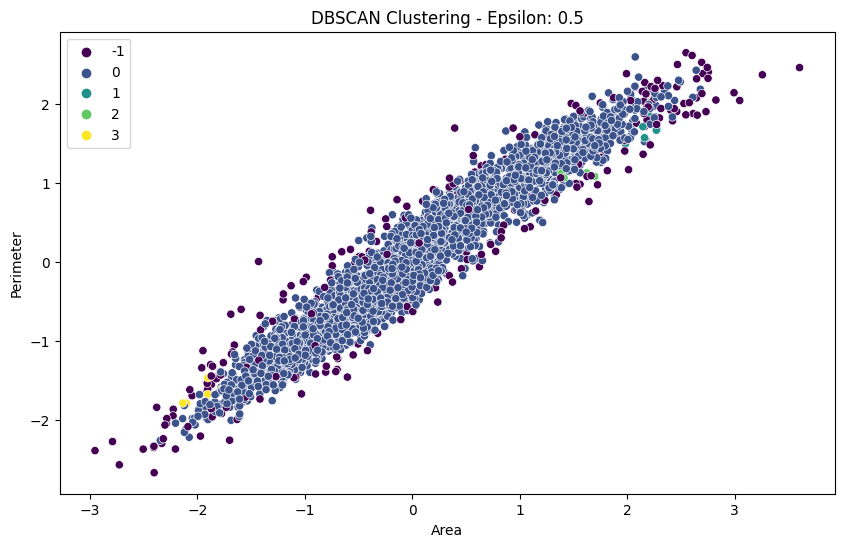

Optimal Value of epsilon from Silhouette Score: 1.5 with score: 0.45570437956660836
Optimal Value of epsilon from Davies Bouldin Index: 1.5 with score: 3.1312342769921293
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 13.248051475955648
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.00615575549803791
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.668934152700387
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: 0.007162094555255835
Dunn Index values for different epsilon values: [0.018148782, 0.05287319, 0.06676201]
Optimal epsilon based on Dunn Index: 1.5



Dataset: Electrical Grid Large Dataset
Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


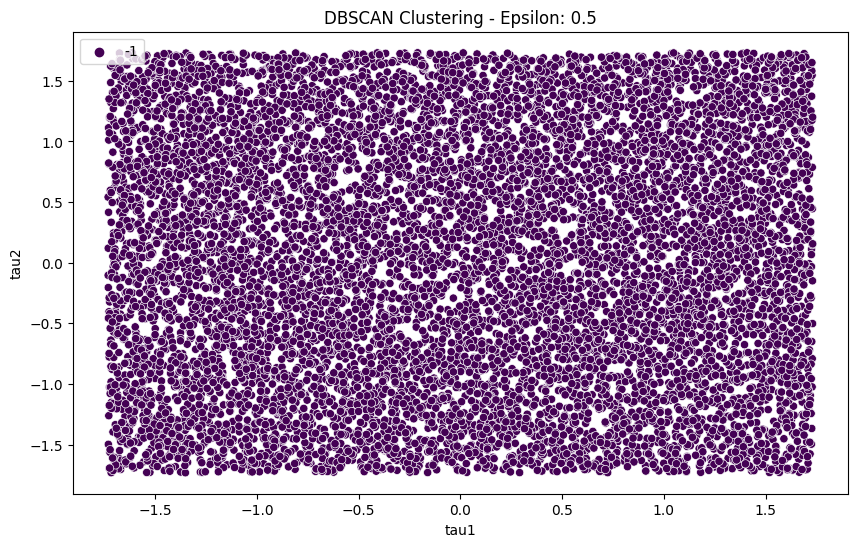

Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.21667363270631154
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.6831207509012203
Optimal Value of epsilon from Calinski Harabasz Index: 1.0 with score: 4.235149859941091
Optimal Value of epsilon from Adjusted Mutual Info: 1.0 with score: 0.023187735602936594
Optimal Value of epsilon from Fowlkes Mallows Score: 1.0 with score: 0.6482294258457701
Optimal Value of epsilon from Adjusted Rand Score: 1.0 with score: 0.05289784444141388
Dunn Index values for different epsilon values: [0.13195969, 0.09594054]
Optimal epsilon based on Dunn Index: 0.5



Dataset: Online Shoppers Intention
Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


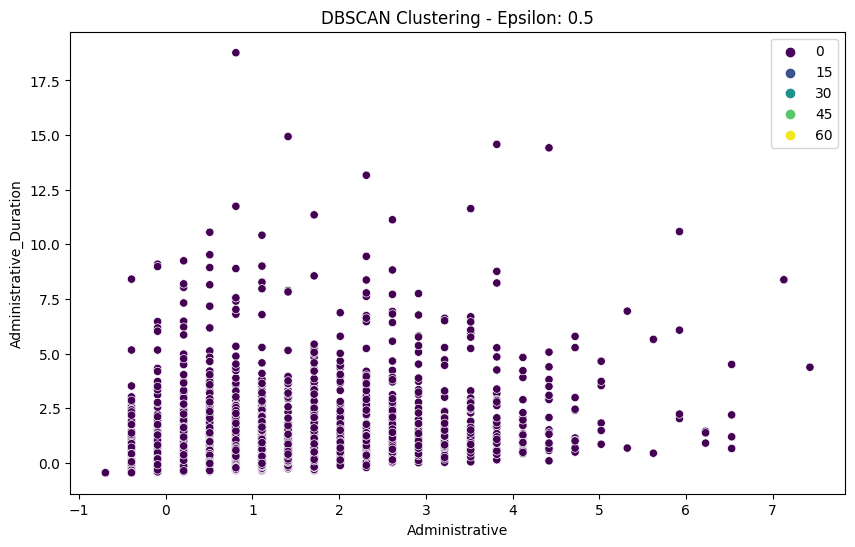

Optimal Value of epsilon from Silhouette Score: 5.0 with score: 0.6887586930058957
Optimal Value of epsilon from Davies Bouldin Index: 4.0 with score: 1.2856509722337024
Optimal Value of epsilon from Calinski Harabasz Index: 5.0 with score: 320.0321926043582
Optimal Value of epsilon from Adjusted Mutual Info: 1.5 with score: 0.02961191654670024
Optimal Value of epsilon from Fowlkes Mallows Score: 1.0 with score: 0.42887992408220493
Optimal Value of epsilon from Adjusted Rand Score: 2.0 with score: 0.055770293745964365
Dunn Index values for different epsilon values: [0.0021638772, 0.00724779, 0.009950195, 0.017198747, 0.025806824, 0.06483519, 0.096762374]
Optimal epsilon based on Dunn Index: 5.0



Dataset: Gas Turbine Dataset
Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


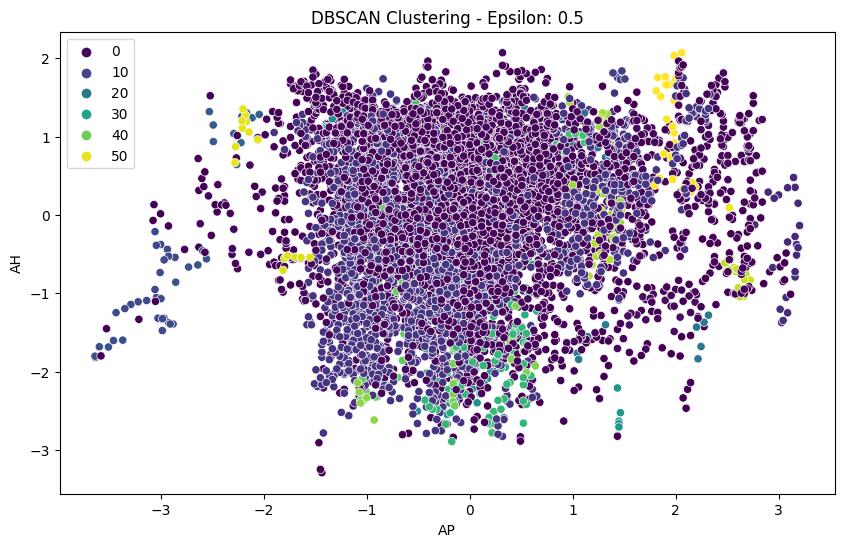

Optimal Value of epsilon from Silhouette Score: 5.0 with score: 0.7546885678399002
Optimal Value of epsilon from Davies Bouldin Index: 5.0 with score: 0.3860415654698013
Optimal Value of epsilon from Calinski Harabasz Index: 3.0 with score: 134.15713591981
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.0027952318525413756
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.004120370192792797
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: 1.2923905162369833e-05
Dunn Index values for different epsilon values: [0.0053065373, 0.015718834, 0.07626044, 0.059337515, 0.110378616, 0.045350023, 0.24984123]
Optimal epsilon based on Dunn Index: 5.0



Dataset: Seoul Bike Dataset
Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


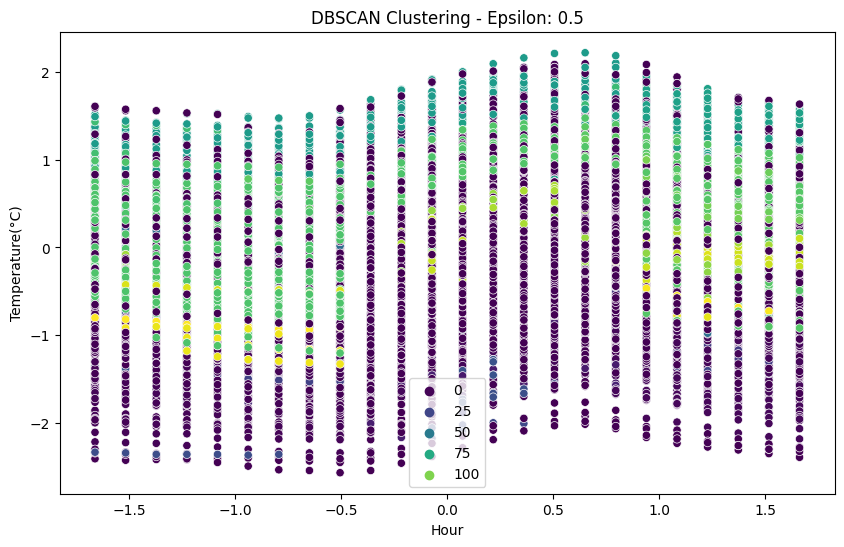

Optimal Value of epsilon from Silhouette Score: 5.0 with score: 0.8152519867812461
Optimal Value of epsilon from Davies Bouldin Index: 5.0 with score: 1.0746106364287298
Optimal Value of epsilon from Calinski Harabasz Index: 3.0 with score: 574.1566771040524
Optimal Value of epsilon from Adjusted Mutual Info: 1.0 with score: 0.02031064344646216
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.53205123093951
Optimal Value of epsilon from Adjusted Rand Score: 3.0 with score: 0.02612388173200716
Dunn Index values for different epsilon values: [0.0036998123, 0.005172004, 0.022505743, 0.03477313, 0.06326592, 0.076479524, 0.1238944]
Optimal epsilon based on Dunn Index: 5.0



Dataset: Facebook Dataset
Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


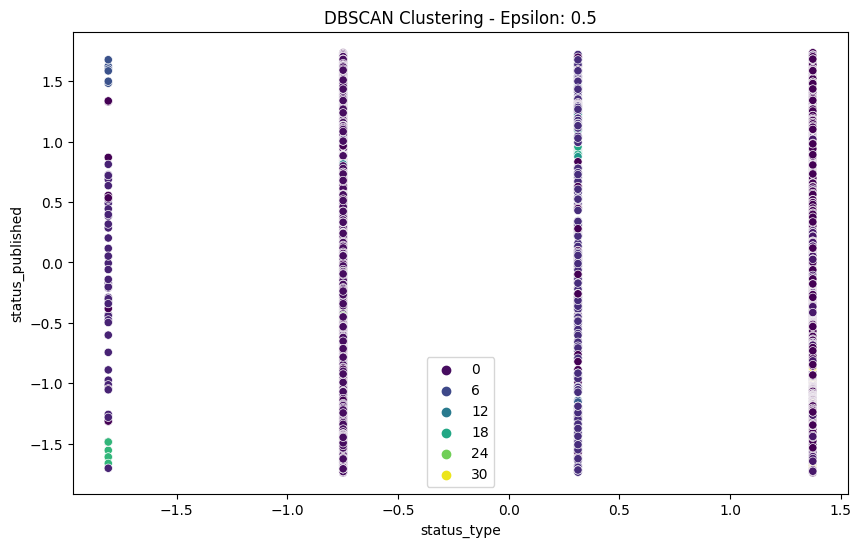

Optimal Value of epsilon from Silhouette Score: 5.0 with score: 0.8699992697707782
Optimal Value of epsilon from Davies Bouldin Index: 4.0 with score: 1.328902992727752
Optimal Value of epsilon from Calinski Harabasz Index: 4.0 with score: 842.2718637956568
Optimal Value of epsilon from Adjusted Mutual Info: 1.5 with score: 0.15558974652879326
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.6157173316293367
Optimal Value of epsilon from Adjusted Rand Score: 1.5 with score: 0.35430787877663517
Dunn Index values for different epsilon values: [0.0032693704, 0.010987518, 0.013574772, 0.011717451, 0.028055921, 0.057002753, 0.09211013]
Optimal epsilon based on Dunn Index: 5.0





In [9]:
def cluster_dbscan(df, eps_value=0.5):
    """
    Perform DBSCAN clustering on the given DataFrame for a range of epsilon and min_samples values.
    Output optimal parameters based on various metrics.

    Parameters:
    - df: DataFrame for clustering
    - eps_values: List of epsilon values to consider
    - min_samples_values: List of min_samples values to consider

    Output:
    - Print optimal parameters and metrics
    - Write results to files
    """

    dframe = df.copy()
    k_values = range(2, 7)
    dbscan = DBSCAN()

    param_grid = {
        'eps': [0.5, 1.0, 1.5, 2.0, 3.0, 4.0, 5.0],
        'min_samples': [5, 10, 15, 20],
        'metric': ['euclidean'],
    }

    # Perform grid search to find the best hyperparameters
    grid_search = GridSearchCV(estimator=dbscan, param_grid=param_grid, cv=5, scoring=silhouette_score)
    grid_search.fit(dframe)
    best_params = grid_search.best_params_
    print("Best DBSCAN Hyperparameters:", best_params)

    # Extract true labels for evaluation
    true_labels = dframe.pop(dframe.columns[-1])

    # Initialize lists to store evaluation metrics
    silhouette_scores, dbi_scores, ch_indices, ami_scores, fm_scores, ar_scores = [], [], [], [], [], []

    # Iterate over different values of epsilon
    for epsilon in param_grid['eps']:
        # Fit DBSCAN with the current epsilon value
        dbscan = DBSCAN(eps=epsilon, min_samples=best_params['min_samples'], metric=best_params['metric'])
        dbscan.fit(dframe)
        labels = set(dbscan.labels_)

        # Visualize cluster assignments for optimal epsilon
        if epsilon == best_params['eps']:
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=dframe.iloc[:, 0], y=dframe.iloc[:, 1], hue=dbscan.labels_, palette='viridis')
            plt.title(f'DBSCAN Clustering - Epsilon: {epsilon}')
            plt.show()

        # Check if there is more than one cluster
        if len(labels) == 1:
            continue

        # Calculate evaluation metrics
        silhouette_avg = silhouette_score(dframe, dbscan.labels_)
        silhouette_scores.append(silhouette_avg)

        dbi = davies_bouldin_score(dframe, dbscan.labels_)
        dbi_scores.append(dbi)

        ch_score = calinski_harabasz_score(dframe, dbscan.labels_)
        ch_indices.append(ch_score)

        predicted_labels = dbscan.labels_

        ami = adjusted_mutual_info_score(true_labels, predicted_labels)
        ami_scores.append(ami)

        fm = fowlkes_mallows_score(true_labels, predicted_labels)
        fm_scores.append(fm)

        ar = adjusted_rand_score(true_labels, predicted_labels)
        ar_scores.append(ar)

    # Print and write results to a file
    file_path = 'C:\\Users\\Dell\\Desktop\\Clustering_Template\\labeled\\dbscan_results.txt'
    with open(file_path, 'a') as file:
        if silhouette_scores:
            optimal_k_silhouette = param_grid['eps'][np.argmax(silhouette_scores)]
            print(f'Optimal Value of epsilon from Silhouette Score: {optimal_k_silhouette} with score: {max(silhouette_scores)}')
            file.write(f'Optimal Value of epsilon from Silhouette Score: {optimal_k_silhouette} with score: {max(silhouette_scores)}\n')

        if dbi_scores:
            optimal_k_dbi = param_grid['eps'][np.argmin(dbi_scores)]
            print(f'Optimal Value of epsilon from Davies Bouldin Index: {optimal_k_dbi} with score: {min(dbi_scores)}')
            file.write(f'Optimal Value of epsilon from Davies Bouldin Index: {optimal_k_dbi} with score: {min(dbi_scores)}\n')

        if ch_indices:
            optimal_k_ch = param_grid['eps'][np.argmax(ch_indices)]
            print(f'Optimal Value of epsilon from Calinski Harabasz Index: {optimal_k_ch} with score: {max(ch_indices)}')
            file.write(f'Optimal Value of epsilon from Calinski Harabasz Index: {optimal_k_ch} with score: {max(ch_indices)}\n')

        if ami_scores:
            optimal_k_ami = param_grid['eps'][np.argmax(ami_scores)]
            print(f'Optimal Value of epsilon from Adjusted Mutual Info: {optimal_k_ami} with score: {max(ami_scores)}')
            file.write(f'Optimal Value of epsilon from Adjusted Mutual Info: {optimal_k_ami} with score: {max(ami_scores)}\n')

        if fm_scores:
            optimal_fm = param_grid['eps'][np.argmin(fm_scores)]
            print(f'Optimal Value of epsilon from Fowlkes Mallows Score: {optimal_fm} with score: {min(fm_scores)}')
            file.write(f'Optimal Value of epsilon from Fowlkes Mallows Score: {optimal_fm} with score: {min(fm_scores)}\n')

        if ar_scores:
            optimal_ar = param_grid['eps'][np.argmax(ar_scores)]
            print(f'Optimal Value of epsilon from Adjusted Rand Score: {optimal_ar} with score: {max(ar_scores)}')
            file.write(f'Optimal Value of epsilon from Adjusted Rand Score: {optimal_ar} with score: {max(ar_scores)}\n')

    # Perform Dunn Index calculation
    dunn_indices = []
    df2 = dframe.astype(np.float32)

    for epsilon in param_grid['eps']:
        dbscan = DBSCAN(eps=epsilon, min_samples=best_params['min_samples'], metric=best_params['metric'])
        dbscan.fit(dframe)
        labels = set(dbscan.labels_)

        if len(labels) == 1:
            continue

        distances = pairwise_distances(df2)
        min_inter_cluster_distance = np.inf
        cluster_indices = np.unique(dbscan.labels_)

        for i in range(len(cluster_indices)):
            for j in range(i + 1, len(cluster_indices)):
                cluster_i_indices = np.where(dbscan.labels_ == cluster_indices[i])[0]
                cluster_j_indices = np.where(dbscan.labels_ == cluster_indices[j])[0]

                if len(cluster_i_indices) > 0 and len(cluster_j_indices) > 0:
                    inter_cluster_distance = np.min(distances[cluster_i_indices][:, cluster_j_indices])
                    min_inter_cluster_distance = min(min_inter_cluster_distance, inter_cluster_distance)

        max_intra_cluster_diameter = max([np.max(distances[np.where(dbscan.labels_ == i)]) for i in cluster_indices])

        dunn_index = min_inter_cluster_distance / max_intra_cluster_diameter
        dunn_indices.append(dunn_index)

    # Print Dunn Index results
    if dunn_indices:
        optimal_k_dunn = param_grid['eps'][np.argmax(dunn_indices)]
        print("Dunn Index values for different epsilon values:", dunn_indices)
        print("Optimal epsilon based on Dunn Index:", optimal_k_dunn)
        # with open(file_path, 'a') as file:
        #     file.write("Dunn Index values for different epsilon values: " + str(dunn_indices) + "\n")
        #     file.write(f"Optimal epsilon based on Dunn Index: {optimal_k_dunn}\n")
    else:
        print('No clusters found')

    print("\n\n")

    # Write optimal k values to another file
    #optimal_k_list = [optimal_k_silhouette, optimal_k_dbi, optimal_k_ch, optimal_k_ami, optimal_fm, optimal_ar, optimal_k_dunn]
    # with open('C:\\Users\\Dell\\Desktop\\Clustering_Template\\labeled\\dbscan.txt', 'a') as file1:
    #     file1.write(f'{max(silhouette_scores)},{min(dbi_scores)},{max(dunn_indices)},{max(ch_indices)},{max(ami_scores)},{max(fm_scores)},{max(ar_scores)},{statistics.mode(optimal_k_list)}\n')

for dataset_name, dataset in cleaned_labeled_datasets:
    print("==================================================")
    print("Dataset:", dataset_name)
    print("==================================================")
    cluster_dbscan(dataset)

for dataset_name, dataset in cleaned_unlabeled_datasets:
    print("==================================================")
    print("Dataset:", dataset_name)
    print("==================================================")
    cluster_dbscan(dataset)

Dataset: Rice Dataset
Best GMM Hyperparameters: {'covariance_type': 'full', 'n_components': 10}


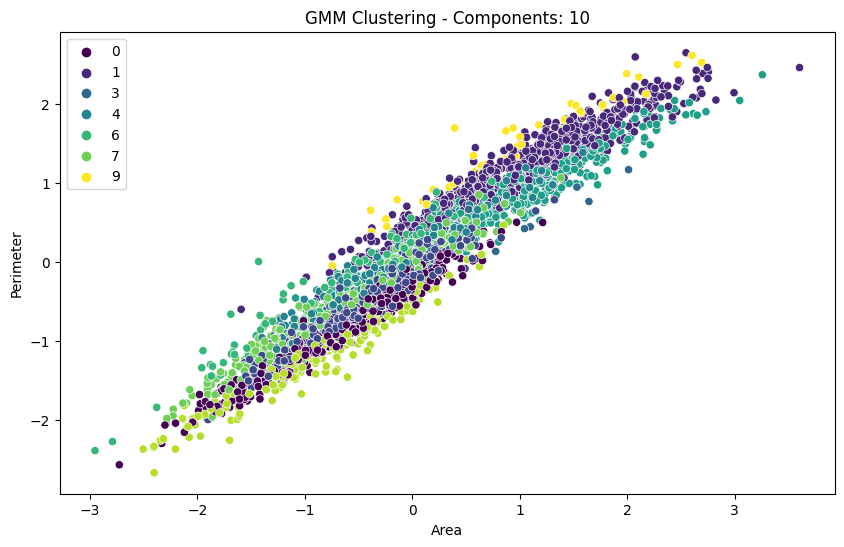

Optimal Value of Components from Silhouette Score: 2 with score: 0.38057038307896407
Optimal Value of Components from Davies Bouldin Index: 2 with score: 1.0223465362074267
Optimal Value of Components from Calinski Harabasz Index: 2 with score: 3010.532065077184
Optimal Value of Components from Adjusted Mutual Info: 2 with score: 1.0
Optimal Value of Components from Fowlkes Mallows Score: 2 with score: 1.0
Optimal Value of Components from Adjusted Rand Score: 2 with score: 1.0



Dunn Index values for different K values: [0.07144247, 0.0059756627, 0.004389144, 0.0072581396, 0.007443424, 0.006766299, 0.006193261, 0.0061869016, 0.0067317006]
Optimal K based on Dunn Index: 2
Dataset: Electrical Grid Large Dataset
Best GMM Hyperparameters: {'covariance_type': 'full', 'n_components': 10}


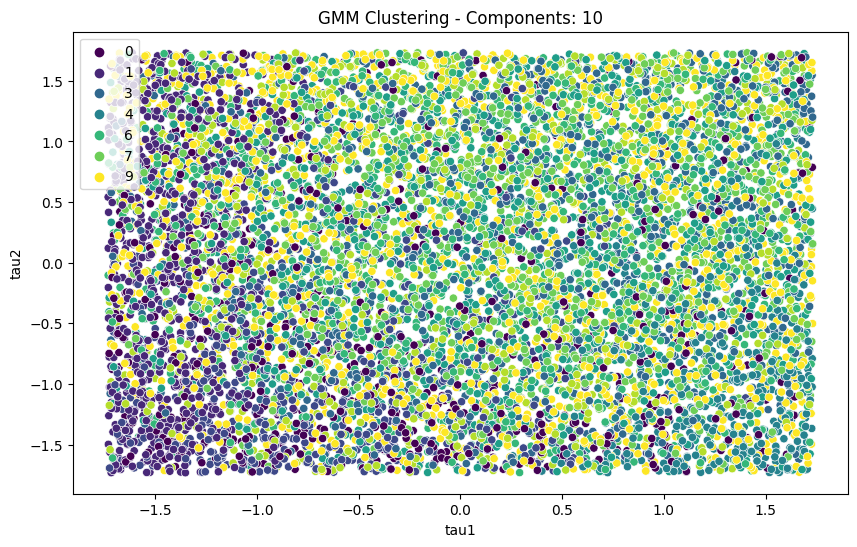

Optimal Value of Components from Silhouette Score: 2 with score: 0.10610378249344748
Optimal Value of Components from Davies Bouldin Index: 3 with score: 2.6896099159081532
Optimal Value of Components from Calinski Harabasz Index: 2 with score: 1114.5610967889397
Optimal Value of Components from Adjusted Mutual Info: 2 with score: 1.0
Optimal Value of Components from Fowlkes Mallows Score: 2 with score: 1.0
Optimal Value of Components from Adjusted Rand Score: 2 with score: 1.0



Dunn Index values for different K values: [0.12541012, 0.07648094, 0.09773445, 0.07648094, 0.07308997, 0.08468652, 0.08468652, 0.07648094, 0.07948153]
Optimal K based on Dunn Index: 2
Dataset: Online Shoppers Intention
Best GMM Hyperparameters: {'covariance_type': 'full', 'n_components': 10}


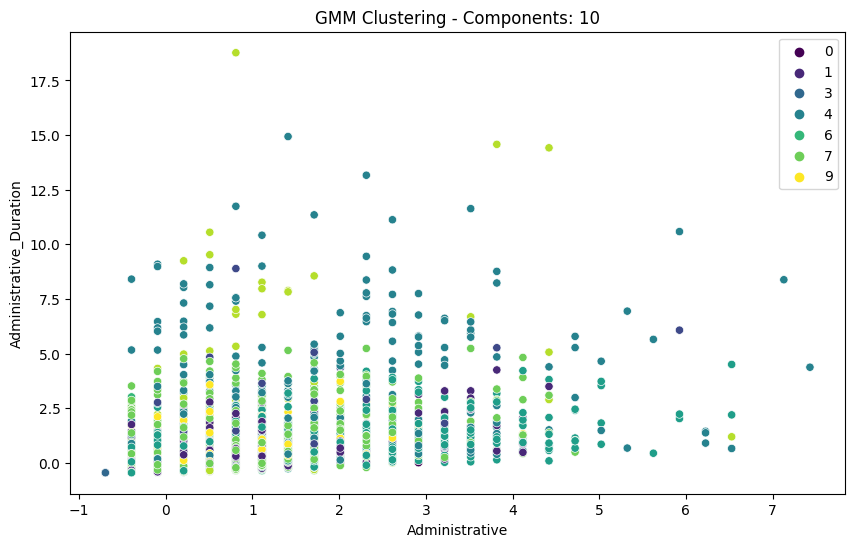

Optimal Value of Components from Silhouette Score: 2 with score: 0.15473799289576823
Optimal Value of Components from Davies Bouldin Index: 9 with score: 2.7126234531923483
Optimal Value of Components from Calinski Harabasz Index: 2 with score: 1123.2138932558473
Optimal Value of Components from Adjusted Mutual Info: 3 with score: 0.27520480141048087
Optimal Value of Components from Fowlkes Mallows Score: 3 with score: 0.7235838204612751
Optimal Value of Components from Adjusted Rand Score: 3 with score: 0.2937987564108274



Dunn Index values for different K values: [0.006473125, 0.005888816, 0.005888816, 0.0050959503, 0.005888816, 0.0050959503, 0.005888816, 0.005888816, 0.0039797733]
Optimal K based on Dunn Index: 2
Dataset: Gas Turbine Dataset
Best GMM Hyperparameters: {'covariance_type': 'full', 'n_components': 6}


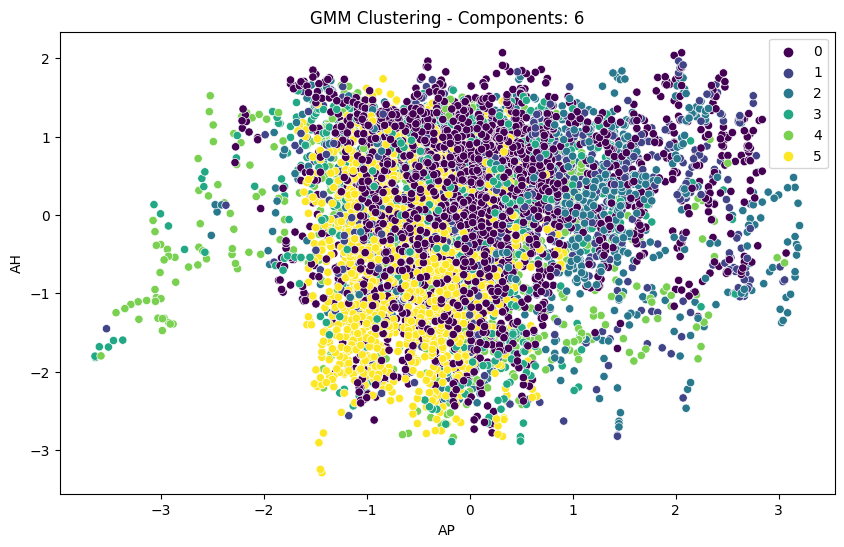

Optimal Value of Components from Silhouette Score: 2 with score: 0.33680470536872975
Optimal Value of Components from Davies Bouldin Index: 2 with score: 1.0401849053071401
Optimal Value of Components from Calinski Harabasz Index: 2 with score: 4069.5873578329592
Optimal Value of Components from Adjusted Mutual Info: 10 with score: 0.006687167837742433
Optimal Value of Components from Fowlkes Mallows Score: 5 with score: 0.004677219526792938
Optimal Value of Components from Adjusted Rand Score: 10 with score: 6.997891071005828e-05



Dunn Index values for different K values: [0.0076478766, 0.007218498, 0.004565478, 0.0058748787, 0.004565478, 0.003958045, 0.004565478, 0.003761042, 0.0063779196]
Optimal K based on Dunn Index: 2
Dataset: Seoul Bike Dataset
Best GMM Hyperparameters: {'covariance_type': 'full', 'n_components': 5}


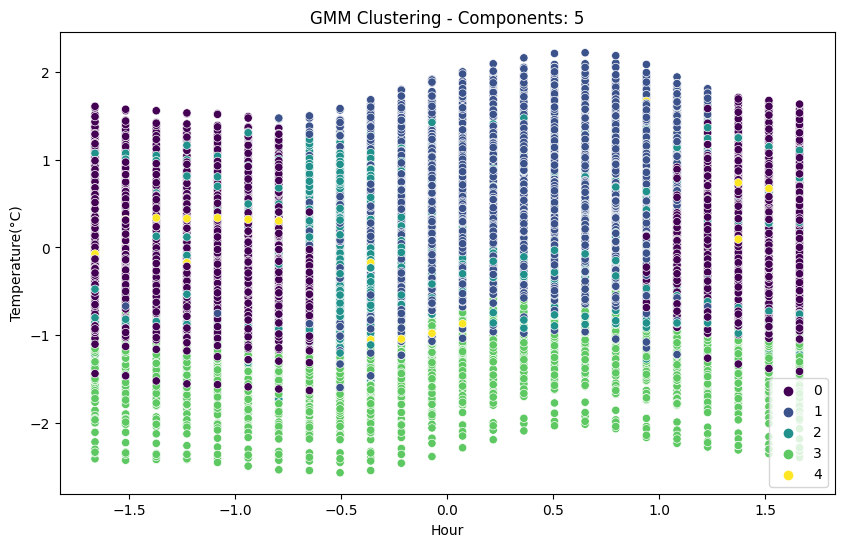

Optimal Value of Components from Silhouette Score: 2 with score: 0.2598733113876968
Optimal Value of Components from Davies Bouldin Index: 6 with score: 1.683124707099096
Optimal Value of Components from Calinski Harabasz Index: 5 with score: 865.9688730926899
Optimal Value of Components from Adjusted Mutual Info: 2 with score: 0.37377406926367546
Optimal Value of Components from Fowlkes Mallows Score: 2 with score: 0.9372347992426568
Optimal Value of Components from Adjusted Rand Score: 2 with score: 0.46749801654629497



Dunn Index values for different K values: [0.0056037507, 0.0044453335, 0.0044453335, 0.0032352963, 0.0032352963, 0.0032352963, 0.0032352963, 0.0032352963, 0.0032352963]
Optimal K based on Dunn Index: 2
Dataset: Facebook Dataset
Best GMM Hyperparameters: {'covariance_type': 'full', 'n_components': 9}


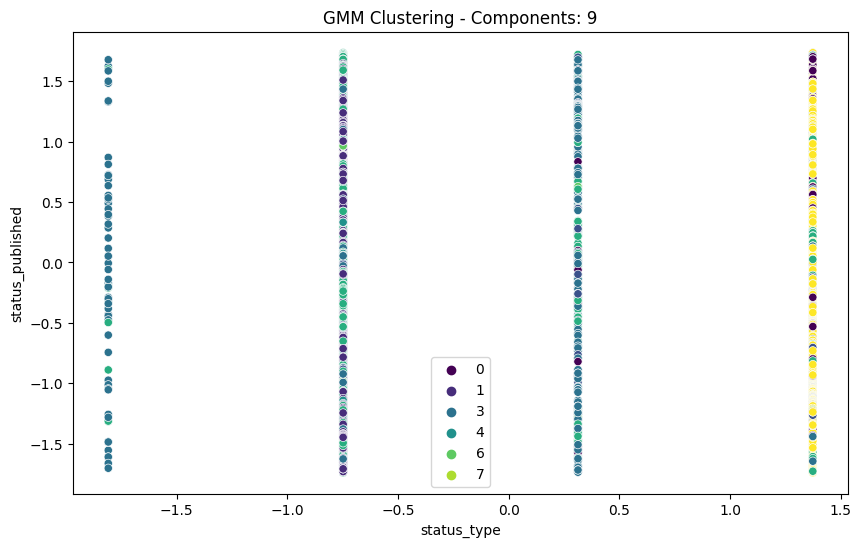

Optimal Value of Components from Silhouette Score: 2 with score: 0.34073088800274337
Optimal Value of Components from Davies Bouldin Index: 7 with score: 2.0307382074465465
Optimal Value of Components from Calinski Harabasz Index: 2 with score: 873.7427619506561
Optimal Value of Components from Adjusted Mutual Info: 3 with score: 0.3061525770571324
Optimal Value of Components from Fowlkes Mallows Score: 2 with score: 0.8004816401887731
Optimal Value of Components from Adjusted Rand Score: 3 with score: 0.24452850451145827



Dunn Index values for different K values: [0.00042500874, 0.00032399723, 0.00046652043, 0.00021681016, 0.00046652043, 0.00020105355, 0.00021681016, 0.00046079425, 0.00061932695]
Optimal K based on Dunn Index: 10


In [11]:

def cluster_gmm(dframe, num_components=3):
    """
    Perform Gaussian Mixture Model (GMM) clustering on the given DataFrame for a range of K values.
    Output optimal K values based on various metrics.

    Parameters:
    - df: DataFrame for clustering
    - k_values: Maximum number of clusters to consider

    Output:
    - Print optimal K values and metrics
    - Write results to files
    """

    param_grid = {
        'n_components': range(2, num_components + 1),
        'covariance_type': ['full', 'tied', 'diag', 'spherical']
    }

    gmm = GaussianMixture()

    # Perform grid search to find the best hyperparameters
    grid_search = GridSearchCV(estimator=gmm, param_grid=param_grid, cv=5)
    grid_search.fit(X=dframe.iloc[:, :-1], y=dframe.iloc[:, -1])
    best_params = grid_search.best_params_
    print("Best GMM Hyperparameters:", best_params)

    # Initialize lists to store evaluation metrics
    silhouette_scores, dbi_scores, ch_indices, ami_scores, fm_scores, ar_scores, dunn_indices = [], [], [], [], [], [], []

    # Iterate through each number of components
    for n_components in range(2, num_components + 1):
        # Fit GMM clustering with the current number of components
        gmm = GaussianMixture(n_components=n_components, covariance_type=best_params['covariance_type'])
        gmm.fit(dframe)
        labels = gmm.predict(dframe)

        # Calculate and store evaluation metrics
        silhouette_avg = silhouette_score(dframe, labels)
        silhouette_scores.append(silhouette_avg)

        dbi = davies_bouldin_score(dframe, labels)
        dbi_scores.append(dbi)

        ch_score = calinski_harabasz_score(dframe, labels)
        ch_indices.append(ch_score)

        predicted_labels = labels
        true_labels = dframe.iloc[:, -1]

        ami = adjusted_mutual_info_score(true_labels, predicted_labels)
        ami_scores.append(ami)

        fm = fowlkes_mallows_score(true_labels, predicted_labels)
        fm_scores.append(fm)

        ar = adjusted_rand_score(true_labels, predicted_labels)
        ar_scores.append(ar)


        # Visualize cluster assignments for optimal number of components
        if n_components == best_params['n_components']:
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=dframe.iloc[:, 0], y=dframe.iloc[:, 1], hue=labels, palette='viridis')
            plt.title(f'GMM Clustering - Components: {n_components}')
            plt.show()

    # Find the number of components with the highest Silhouette Score, Davies Bouldin Index, Calinski Harabasz Index, AMI, FM, and AR
    optimal_n_components_silhouette = param_grid['n_components'][np.argmax(silhouette_scores)]
    optimal_n_components_dbi = param_grid['n_components'][np.argmin(dbi_scores)]
    optimal_n_components_ch = param_grid['n_components'][np.argmax(ch_indices)]
    optimal_n_components_ami = param_grid['n_components'][np.argmax(ami_scores)]
    optimal_n_components_fm = param_grid['n_components'][np.argmax(fm_scores)]
    optimal_n_components_ar = param_grid['n_components'][np.argmax(ar_scores)]
    #optimal_n_components_dunn = param_grid['n_components'][np.argmax(dunn_indices)]

    # Print the optimal number of components for each metric
    print('Optimal Value of Components from Silhouette Score:', optimal_n_components_silhouette, 'with score:', max(silhouette_scores))
    print('Optimal Value of Components from Davies Bouldin Index:', optimal_n_components_dbi, 'with score:', min(dbi_scores))
    print('Optimal Value of Components from Calinski Harabasz Index:', optimal_n_components_ch, 'with score:', max(ch_indices))
    print('Optimal Value of Components from Adjusted Mutual Info:', optimal_n_components_ami, 'with score:', max(ami_scores))
    print('Optimal Value of Components from Fowlkes Mallows Score:', optimal_n_components_fm, 'with score:', max(fm_scores))
    print('Optimal Value of Components from Adjusted Rand Score:', optimal_n_components_ar, 'with score:', max(ar_scores))
    #print('Optimal Value of Components from Dunn Index:', optimal_n_components_dunn, 'with score:', max(dunn_indices))
    print("\n\n")
    k_values = range(2, num_components + 1)
    dunn_indices = []
    df2=dframe.astype(np.float32)
    # Iterate through each K value
    for k in range(2, num_components + 1):
        # Fit K-Means clustering with the current K value
        gmm = GaussianMixture(n_components=k, covariance_type=best_params['covariance_type'])
        gmm.fit(df2)
        labels = gmm.predict(df2)
        # Calculate the pairwise distances between data points
        distances = pairwise_distances(df2)

        # Calculate the minimum inter-cluster distance
        min_inter_cluster_distance = np.inf
        for i in range(k):
            for j in range(i + 1, k):
                inter_cluster_distance = np.min(distances[np.where(labels == i)][:, np.where(labels == j)])
                min_inter_cluster_distance = min(min_inter_cluster_distance, inter_cluster_distance)

        # Calculate the maximum intra-cluster diameter
        max_intra_cluster_diameter = max([np.max(distances[np.where(labels == i)]) for i in range(k)])

        # Calculate the Dunn Index and append it to the list
        dunn_index = min_inter_cluster_distance / max_intra_cluster_diameter
        dunn_indices.append(dunn_index)

    # Find the K with the highest Dunn Index
    optimal_k = k_values[np.argmax(dunn_indices)]

    # Print the Dunn Index values and the optimal K
    print("Dunn Index values for different K values:", dunn_indices)
    print("Optimal K based on Dunn Index:", optimal_k)


for dataset_name, dataset in cleaned_labeled_datasets:
    print("========================")
    print("Dataset:", dataset_name)
    print("========================")
    cluster_gmm(dataset, num_components=10)

for dataset_name, dataset in cleaned_unlabeled_datasets:
    print("========================")
    print("Dataset:", dataset_name)
    print("========================")
    cluster_gmm(dataset, num_components=10)

Dataset: Rice Dataset
{'num_clusters': 2, 'fuzziness': 1.1}


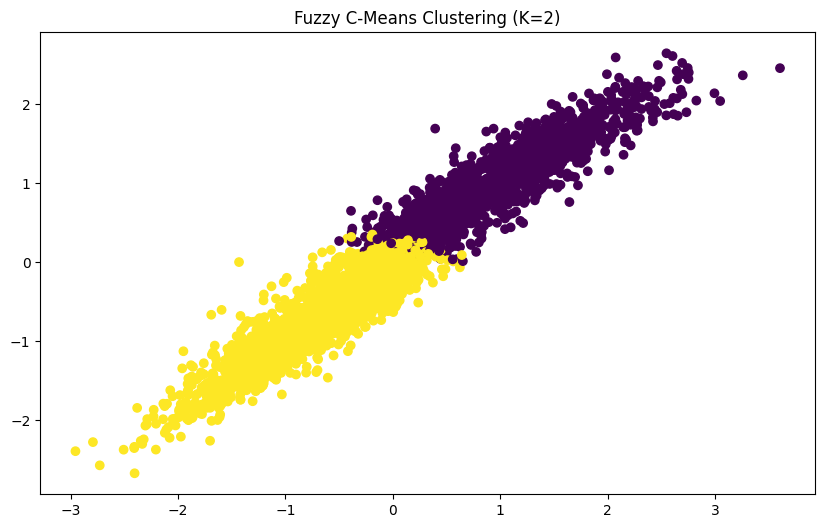

Optimal Number of Clusters from Silhouette Score: 2 with score: 0.4174465005810219
Optimal Number of Clusters from Davies Bouldin Index: 2 with score: 0.9386495691387735
Optimal Number of Clusters from Calinski Harabasz Index: 2 with score: 3587.4119397539534
Optimal Number of Clusters from Adjusted Mutual Info: 2 with score: 0.6035721255632562
Optimal Number of Clusters from Fowlkes Mallows Score: 2 with score: 0.860959198741769
Optimal Number of Clusters from Adjusted Rand Score: 2 with score: 0.7149145804304605
Dataset: Electrical Grid Large Dataset
{'num_clusters': 2, 'fuzziness': 1.1}


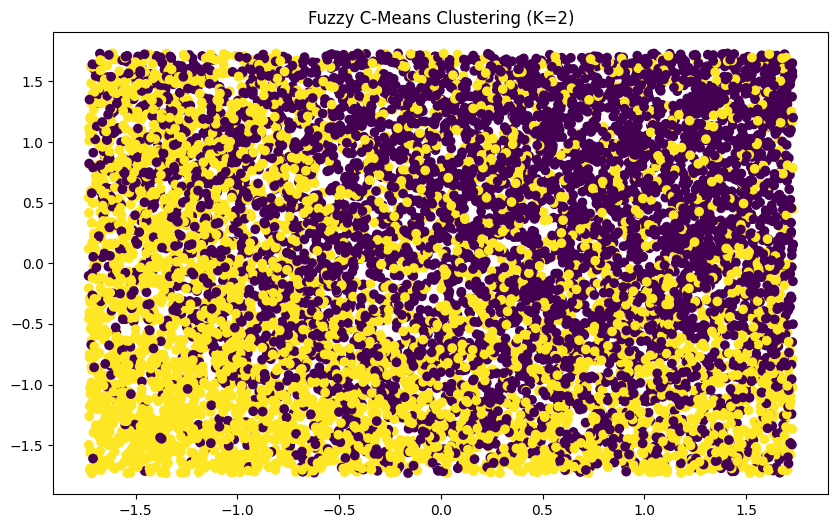

Optimal Number of Clusters from Silhouette Score: 2 with score: 0.10246385109776615
Optimal Number of Clusters from Davies Bouldin Index: 3 with score: 2.537980271286582
Optimal Number of Clusters from Calinski Harabasz Index: 2 with score: 1169.472864197939
Optimal Number of Clusters from Adjusted Mutual Info: 2 with score: 0.5940689607612064
Optimal Number of Clusters from Fowlkes Mallows Score: 2 with score: 0.8294220151806464
Optimal Number of Clusters from Adjusted Rand Score: 2 with score: 0.6432551010573262
Dataset: Online Shoppers Intention
{'num_clusters': 2, 'fuzziness': 1.1}


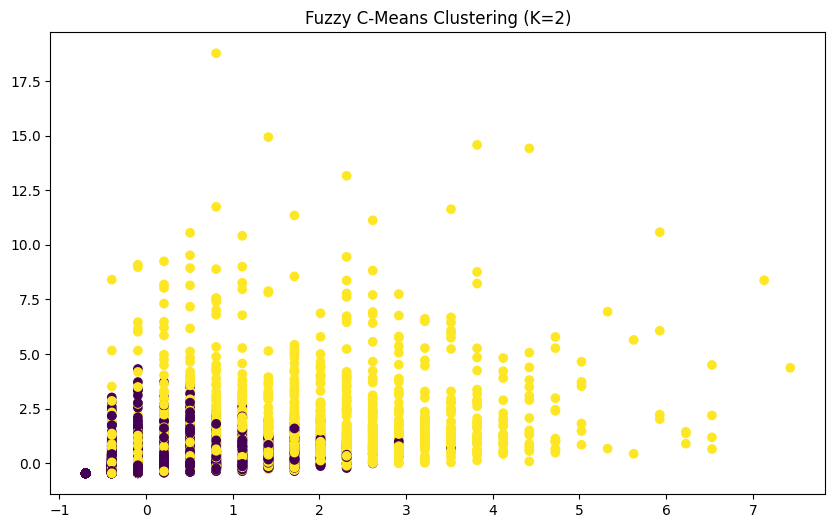

Optimal Number of Clusters from Silhouette Score: 2 with score: 0.24653636087180897
Optimal Number of Clusters from Davies Bouldin Index: 6 with score: 1.790143444969786
Optimal Number of Clusters from Calinski Harabasz Index: 3 with score: 1604.2878879244086
Optimal Number of Clusters from Adjusted Mutual Info: 3 with score: 0.03578245396773981
Optimal Number of Clusters from Fowlkes Mallows Score: 2 with score: 0.7554554854228998
Optimal Number of Clusters from Adjusted Rand Score: 2 with score: 0.11055212877972115
Dataset: Gas Turbine Dataset
{'num_clusters': 2, 'fuzziness': 1.1}


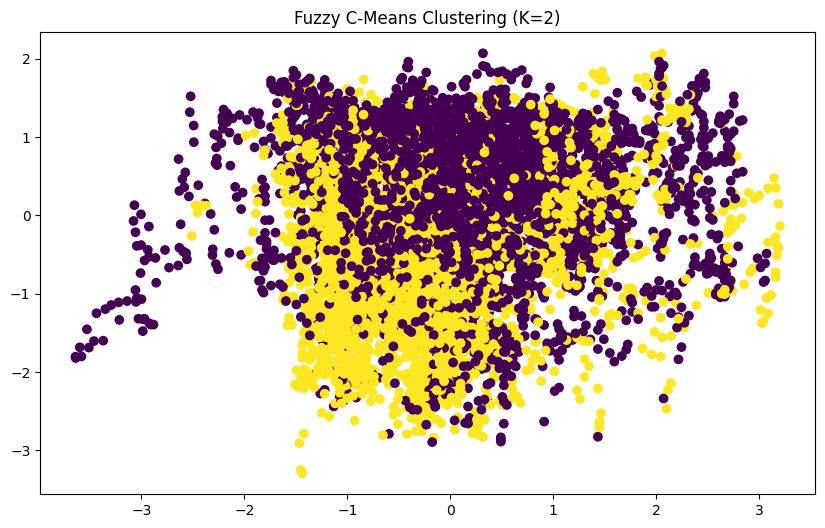

Optimal Number of Clusters from Silhouette Score: 2 with score: 0.35428657751415993
Optimal Number of Clusters from Davies Bouldin Index: 2 with score: 1.0737010142930894
Optimal Number of Clusters from Calinski Harabasz Index: 2 with score: 5021.441191030053
Optimal Number of Clusters from Adjusted Mutual Info: 5 with score: 0.006242701700424955
Optimal Number of Clusters from Fowlkes Mallows Score: 5 with score: 0.004473936474378511
Optimal Number of Clusters from Adjusted Rand Score: 9 with score: 6.219507586304647e-05
Dataset: Seoul Bike Dataset
{'num_clusters': 2, 'fuzziness': 1.1}


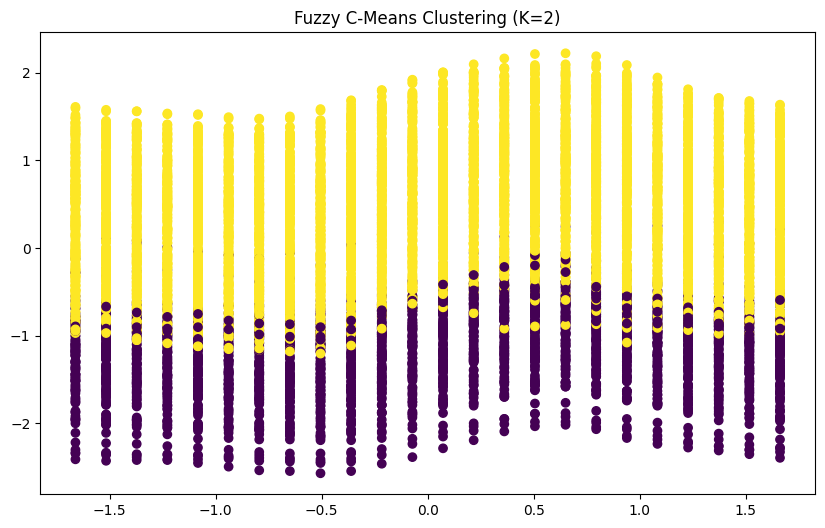

Optimal Number of Clusters from Silhouette Score: 9 with score: 0.21745810543588603
Optimal Number of Clusters from Davies Bouldin Index: 9 with score: 1.2585988137408388
Optimal Number of Clusters from Calinski Harabasz Index: 2 with score: 1634.7671287347712
Optimal Number of Clusters from Adjusted Mutual Info: 6 with score: 0.15905926496039272
Optimal Number of Clusters from Fowlkes Mallows Score: 2 with score: 0.7339039130270114
Optimal Number of Clusters from Adjusted Rand Score: 6 with score: 0.03174797021227688
Dataset: Facebook Dataset
{'num_clusters': 2, 'fuzziness': 1.2}


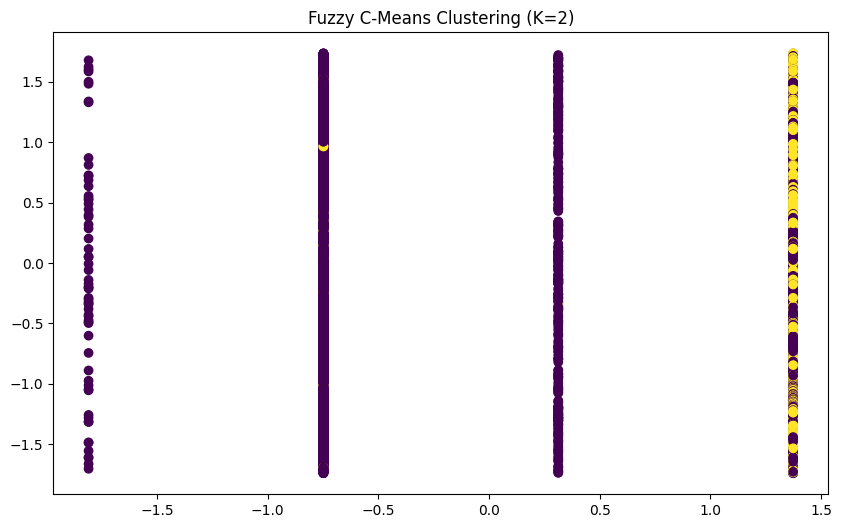

Optimal Number of Clusters from Silhouette Score: 2 with score: 0.6462601998151344
Optimal Number of Clusters from Davies Bouldin Index: 6 with score: 1.091337315997664
Optimal Number of Clusters from Calinski Harabasz Index: 2 with score: 1734.8425991226138
Optimal Number of Clusters from Adjusted Mutual Info: 2 with score: 0.26895244713817956
Optimal Number of Clusters from Fowlkes Mallows Score: 2 with score: 0.9408964248577427
Optimal Number of Clusters from Adjusted Rand Score: 2 with score: 0.5128218976913478


In [10]:
def find_best_fuzzy_c_means_params(data_array, k_values, fuzziness_values):
    best_score = -1
    best_params = {}

    for num_clusters in k_values:
        for fuzziness in fuzziness_values:
            # Fuzzy C-means clustering
            centers, membership, _, _, _, _, _ = fuzz.cluster.cmeans(
                data_array.T, num_clusters, fuzziness, error=0.005, maxiter=1000, init=None
            )

            # Get the cluster membership values
            cluster_membership = np.argmax(membership, axis=0)

            # Evaluate clustering performance (replace with your own metric)
            score = silhouette_score(data_array, cluster_membership)
            if score > best_score:
                best_score = score
                best_params['num_clusters'] = num_clusters
                best_params['fuzziness'] = fuzziness

    return best_params

def evaluate_fuzzy_c_means(data_array, num_clusters, fuzziness, true_labels):
    # Fuzzy C-means clustering
    centers, membership, _, _, _, _, _ = fuzz.cluster.cmeans(
        data_array.T, num_clusters, fuzziness, error=0.005, maxiter=1000, init=None
    )

    # Get the cluster membership values
    cluster_membership = np.argmax(membership, axis=0)

    # Evaluate clustering performance
    silhouette_avg = silhouette_score(data_array, cluster_membership)
    dbi = davies_bouldin_score(data_array, cluster_membership)
    ch_score = calinski_harabasz_score(data_array, cluster_membership)
    ami = adjusted_mutual_info_score(true_labels, cluster_membership)
    fm = fowlkes_mallows_score(true_labels, cluster_membership)
    ar = adjusted_rand_score(true_labels, cluster_membership)

    return silhouette_avg, dbi, ch_score, ami, fm, ar, cluster_membership

def cluster_fuzzy_c_means(dframe, num_clusters=3):
    """
    Perform Fuzzy C-Means clustering on the given DataFrame for a range of c and m values.
    Output optimal parameters based on various metrics.

    Parameters:
    - df: DataFrame for clustering
    - k_values: Maximum number of clusters to consider

    Output:
    - Print optimal parameters and metrics
    - Write results to files
    """

    data_array = dframe.values

    # Define the range of values for the number of clusters and fuzziness
    k_values = range(2, num_clusters)
    fuzziness_values = [1.1, 1.2, 1.3, 1.4, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5]

    # Find the best parameters for Fuzzy C-means clustering
    best_params = find_best_fuzzy_c_means_params(data_array, k_values, fuzziness_values)

    # Print the best parameters
    print(best_params)

    silhouette_scores, dbi_scores, ch_scores, ami_scores, fm_scores, ar_scores = [], [], [], [], [], []

    for num_clusters in k_values:
        # Evaluate Fuzzy C-means clustering for the current number of clusters
        silhouette_avg, dbi, ch_score, ami, fm, ar, cluster_membership = evaluate_fuzzy_c_means(
            data_array, num_clusters, best_params['fuzziness'], dframe.iloc[:, -1]
        )

        # Append the evaluation scores to the respective lists
        silhouette_scores.append(silhouette_avg)
        dbi_scores.append(dbi)
        ch_scores.append(ch_score)
        ami_scores.append(ami)
        fm_scores.append(fm)
        ar_scores.append(ar)

        if num_clusters == best_params['num_clusters']:
          plt.figure(figsize=(10, 6))
          plt.scatter(data_array[:, 0], data_array[:, 1], hue=cluster_membership, palette='viridis')
          plt.title(f'Fuzzy C-Means Clustering (K={num_clusters})')
          plt.show()

    # Find the optimal number of clusters based on different evaluation metrics
    optimal_num_clusters_silhouette = k_values[np.argmax(silhouette_scores)]
    optimal_num_clusters_dbi = k_values[np.argmin(dbi_scores)]
    optimal_num_clusters_ch = k_values[np.argmax(ch_scores)]
    optimal_num_clusters_ami = k_values[np.argmax(ami_scores)]
    optimal_num_clusters_fm = k_values[np.argmax(fm_scores)]
    optimal_num_clusters_ar = k_values[np.argmax(ar_scores)]

    print('Optimal Number of Clusters from Silhouette Score:', optimal_num_clusters_silhouette, 'with score:', max(silhouette_scores))
    print('Optimal Number of Clusters from Davies Bouldin Index:', optimal_num_clusters_dbi, 'with score:', min(dbi_scores))
    print('Optimal Number of Clusters from Calinski Harabasz Index:', optimal_num_clusters_ch, 'with score:', max(ch_scores))
    print('Optimal Number of Clusters from Adjusted Mutual Info:', optimal_num_clusters_ami, 'with score:', max(ami_scores))
    print('Optimal Number of Clusters from Fowlkes Mallows Score:', optimal_num_clusters_fm, 'with score:', max(fm_scores))
    print('Optimal Number of Clusters from Adjusted Rand Score:', optimal_num_clusters_ar, 'with score:', max(ar_scores))

    dunn_indices = []
    for k in k_values:
      cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(data_array.T, c=k, m=2, error=0.005, maxiter=1000, init=None)
      cluster_membership = np.argmax(u, axis=0)
      min_inter_cluster_distance = np.min(np.min(np.sqrt(((cntr[:, np.newaxis, :] - cntr[:, :, np.newaxis])**2).sum(axis=0))))
      max_intra_cluster_diameter = np.max([np.max(np.sum(u[i, :, np.newaxis] * np.sqrt(np.sum((data_array.T - cntr[:, i][:, np.newaxis])**2, axis=0)), axis=0)) for i in range(cntr.shape[0])])

      dunn_index = min_inter_cluster_distance / max_intra_cluster_diameter
      dunn_indices.append(dunn_index)

    optimal_k = k_values[np.argmax(dunn_indices)]

    print("Dunn Index values for different K values:", dunn_indices)
    print("Optimal K based on Dunn Index:", optimal_k)
    print("\n\n")

for dataset_name, dataset in cleaned_labeled_datasets:
    print("\n\n=========================")
    print("Dataset:", dataset_name)
    print("=========================\n\n")
    cluster_fuzzy_c_means(dataset, 10)

for dataset_name, dataset in cleaned_unlabeled_datasets:
    print("\n\n=========================")
    print("Dataset:", dataset_name)
    print("=========================\n\n")
    cluster_fuzzy_c_means(dataset, 10)